In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preparing Datasets

In [2]:
from sklearn.preprocessing import QuantileTransformer

df_harvard = pd.read_csv('./data/harvard_feature_engineered.csv', sep=';', decimal=',')
df_triage = pd.read_csv('./data/triage_feature_engineered.csv', sep=';', decimal=',')

df_triage.dropna(subset=['Exacerbation'], inplace=True)
df_harvard.dropna(subset=['Exacerbation'], inplace=True)

# only consider records in triage where smoker is 1
# triage_copy = triage_copy[triage_copy['Smoker'] == 1]
# print(triage_copy.shape)

# TODO manually add all the vars that possibly could be used in harmonization
relevant_harvard_vars = [ '% FEV1 b', 'Age', 'Height', 'Weight', 'BMI', 'MMRC', 'Exacerbation', 'GOLD', 'Coronary Artery Disease', 'Gender, Male', 'Diabetes', 'Kidney disease', 'Congestive Heart Failure', 'Hypertension', 'Oxygen Therapy', 'ICU last year', 'Asthma', 'Hospitalized last year', '2+ Exa. last year', 'Daily Inhaler', 'Lives alone', 'Pill to control Exa.', 'Rescue Inhaler', 'Night Symptoms'] #'% FEV1 a',
relevant_triage_vars = ['% FEV1 b',  'Age', 'Height', 'Weight', 'BMI', 'MMRC b', 'Exacerbation', 'GOLD', 'Coronary Artery Disease', 'Gender, Male', 'Diabetes', 'Kidney disease', 'Congestive Heart Failure', 'Hypertension', 'Oxygen Therapy', 'ICU last year', 'Asthma', 'Hospitalized last year', '2+ Exa. last year', 'Daily Inhaler', 'Lives alone', 'Pill to control Exa.', 'Rescue Inhaler', 'Night Symptoms']

# get all columns with the same names in both datasets

df_triage.rename(columns={ 'MMRC b': 'MMRC'}, inplace=True)
# shared_columns = list(set(df_harvard.columns).intersection(set(df_triage.columns)))
# df_triage = df_triage[shared_columns]
# df_harvard = df_harvard[shared_columns]
# print(df_harvard.shape)
# try applying some sort of transformation to different selections of variables


In [28]:
# create a scatter plot of each variable against another variable
variables_to_show = shared_columns
variables_to_show.remove('Exacerbation')
fig, axs = plt.subplots(28, 28, figsize=(150, 150))
for i in range(28):
    for j in range(28):
        if i == j:
            pass
            # # create a list of the current variable and the exacerbation variable
            # subset = df_harvard[[shared_columns[i], 'Exacerbation']]
            # sns.histplot(data=subset, ax=axs[i, j], kde=True, hue='Exacerbation')
            # axs[i, j].set_title(shared_columns[i])
        else:
            axs[i, j].scatter(df_harvard[variables_to_show[i]], df_harvard[variables_to_show[j]], c=df_harvard['Exacerbation'], )
            axs[i, j].set_title(variables_to_show[i] + ' vs ' + variables_to_show[j])

In [12]:
# perform quantile transformation for all numeric variables
numeric_columns = ['% FEV1 b', 'Age', 'Height', 'Weight', 'BMI', 'MMRC', 'GOLD']
for column in numeric_columns:
    transformer = QuantileTransformer(n_quantiles=100, random_state=0, output_distribution='normal')
    df_harvard[column] = transformer.fit_transform(df_harvard[column].values.reshape(-1, 1))
    df_triage[column] = transformer.transform(df_triage[column].values.reshape(-1, 1))

# create a scatter plot of each variable against another variable
variables_to_show = shared_columns
variables_to_show.remove('Exacerbation')
fig, axs = plt.subplots(28, 28, figsize=(150, 150))
for i in range(28):
    for j in range(28):
        if i == j:
            pass
            # # create a list of the current variable and the exacerbation variable
            # subset = df_harvard[[shared_columns[i], 'Exacerbation']]
            # sns.histplot(data=subset, ax=axs[i, j], kde=True, hue='Exacerbation')
            # axs[i, j].set_title(shared_columns[i])
        else:
            axs[i, j].scatter(df_harvard[variables_to_show[i]], df_harvard[variables_to_show[j]], c=df_harvard['Exacerbation'], )
            axs[i, j].set_title(variables_to_show[i] + ' vs ' + variables_to_show[j])

# Feature Importance

In [21]:
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder

target = 'Exacerbation'

discrete_features_triage = df_triage.columns[df_triage.nunique() <= 5].drop(target)
continuous_features_triage = df_triage.columns[df_triage.nunique() > 5]
discrete_features_harvard = df_harvard.columns[df_harvard.nunique() <= 10].drop(target)
continuous_features_harvard = df_harvard.columns[df_harvard.nunique() > 10]


harvard_copy = df_harvard.copy()
triage_copy = df_triage.copy()
shared_columns = list(set(harvard_copy.columns).intersection(set(triage_copy.columns)))
harvard_copy = harvard_copy[shared_columns]
triage_copy = triage_copy[shared_columns]


# only consider smokers
X_harvard = harvard_copy.drop(target, axis=1)
X_triage = triage_copy.drop(target, axis=1)
mutual_info_split_harvard = pd.DataFrame(columns=sorted(X_harvard.columns))
mutual_info_split_triage = pd.DataFrame(columns=sorted(X_triage.columns))
rf_split_harvard = pd.DataFrame(columns=sorted(X_harvard.columns))
rf_split_triage = pd.DataFrame(columns=sorted(X_triage.columns))
# use median to impute NaN values
X_harvard = X_harvard.fillna(X_harvard.median())
# transform back to dataframe
X_harvard = pd.DataFrame(X_harvard, columns=harvard_copy.drop(target, axis=1).columns)
X_triage = X_triage.fillna(X_triage.median())
y_harvard = harvard_copy[target]
y_harvard = LabelEncoder().fit_transform(y_harvard)
y_triage = triage_copy[target]
y_triage = LabelEncoder().fit_transform(y_triage)
for i in range(100):
    # create a train test split to shuffle the data
    X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(X_harvard, y_harvard, test_size=0.2, random_state=i)
    X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(X_triage, y_triage, test_size=0.2, random_state=i)
    # infomation gain processing
    # mutual_info_harvard_discrete = mutual_info_classif(X_train_harvard[discrete_features_harvard], y_train_harvard, random_state=42, discrete_features=True)
    # mutual_info_harvard_continuous = mutual_info_classif(X_train_harvard[continuous_features_harvard], y_train_harvard, random_state=42, discrete_features=False)
    # mutual_info_harvard = np.concatenate((mutual_info_harvard_discrete, mutual_info_harvard_continuous), axis=0)
    mutual_info_harvard = mutual_info_classif(X_train_harvard, y_train_harvard, random_state=42)
    # mutual_info_triage_discrete = mutual_info_classif(X_train_triage[discrete_features_triage], y_train_triage, random_state=42, discrete_features=True)
    # mutual_info_triage_continuous = mutual_info_classif(X_train_triage[continuous_features_triage], y_train_triage, random_state=42, discrete_features=False)
    # mutual_info_triage = np.concatenate((mutual_info_triage_discrete, mutual_info_triage_continuous), axis=0)
    mutual_info_triage = mutual_info_classif(X_train_triage, y_train_triage, random_state=42)
    mutual_info_harvard = pd.DataFrame({'variable': X_harvard.columns, 'importances': mutual_info_harvard})
    mutual_info_triage = pd.DataFrame({'variable': X_triage.columns, 'importances': mutual_info_triage})
    # rf processing
    rf_importances_harvard = RandomForestClassifier(random_state=42).fit(X_train_harvard, y_train_harvard).feature_importances_
    rf_importances_triage = RandomForestClassifier(random_state=42).fit(X_train_triage, y_train_triage).feature_importances_
    rf_importances_harvard_df = pd.DataFrame({'variable': X_harvard.columns, 'importances': rf_importances_harvard})
    rf_importances_triage_df = pd.DataFrame({'variable': X_triage.columns, 'importances': rf_importances_triage})
    # sort by feature names
    mutual_info_harvard = mutual_info_harvard.sort_values('variable')
    mutual_info_triage = mutual_info_triage.sort_values('variable')
    rf_importances_harvard_df = rf_importances_harvard_df.sort_values('variable')
    rf_importances_triage_df = rf_importances_triage_df.sort_values('variable')
    # concat the importances to the dataframe. Keep the column index
    mutual_info_split_harvard = pd.concat([mutual_info_split_harvard, mutual_info_harvard.set_index('variable').T])
    mutual_info_split_triage = pd.concat([mutual_info_split_triage, mutual_info_triage.set_index('variable').T])
    rf_split_harvard = pd.concat([rf_split_harvard, rf_importances_harvard_df.set_index('variable').T])
    rf_split_triage = pd.concat([rf_split_triage, rf_importances_triage_df.set_index('variable').T])

mutual_info_split_harvard_medians = mutual_info_split_harvard.median()
mutual_info_split_triage_medians = mutual_info_split_triage.median()
rf_split_harvard_medians = rf_split_harvard.median()
rf_split_triage_medians = rf_split_triage.median()

# sort the columns according to their medians
mutual_info_split_harvard_medians = mutual_info_split_harvard_medians.sort_values(ascending=False)
mutual_info_split_triage_medians = mutual_info_split_triage_medians.sort_values(ascending=False)
rf_split_harvard_medians = rf_split_harvard_medians.sort_values(ascending=False)
rf_split_triage_medians = rf_split_triage_medians.sort_values(ascending=False)

# sort the columns in the split similarly
mutual_info_split_harvard_sorted = mutual_info_split_harvard[mutual_info_split_harvard_medians.index]
mutual_info_split_triage_sorted = mutual_info_split_triage[mutual_info_split_triage_medians.index]
rf_split_harvard_sorted = rf_split_harvard[rf_split_harvard_medians.index]
rf_split_triage_sorted = rf_split_triage[rf_split_triage_medians.index]

['Oxygen Therapy', 'Exacerbation', 'ICU last year', 'Asthma', 'Hospitalized last year', 'MMRC', 'Coronary Artery Disease', 'GOLD', '% FEV1 a', 'Height', 'Age', 'Gender, Male', 'Diabetes', 'BMI', '% FEV1 b', 'Hypertension', 'Congestive Heart Failure', 'Kidney disease', 'Weight', 'MMRC a', 'MMRC b', 'MMRC']


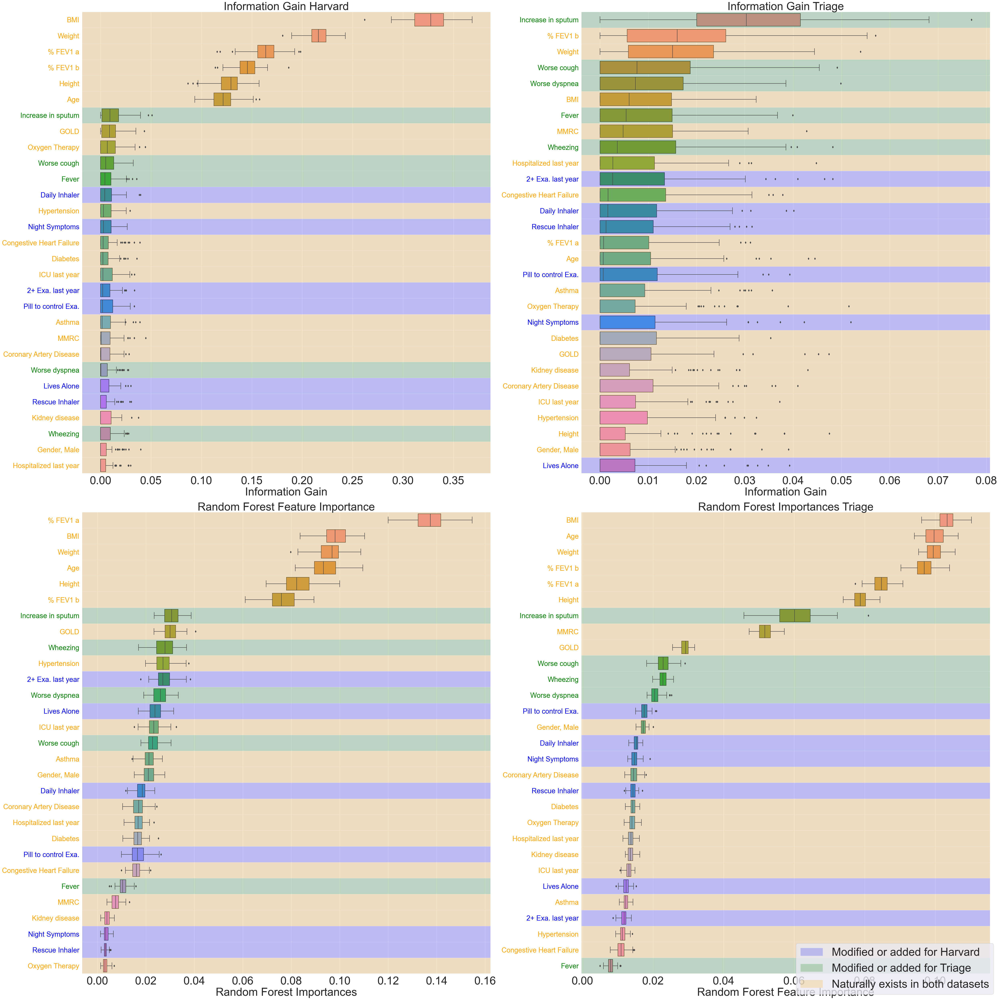

In [22]:
import matplotlib as mpl


modified_triage = ['Increase in sputum',  'Fever', 'Wheezing', 'Worse dyspnea', 'Worse cough']
modified_harvard = ['Night Symptoms', 'Rescue Inhaler', '2+ Exa. last year', 'Lives Alone', 'Daily Inhaler', 'Pill to control Exa.']
naturally_existing_in_both = [var for var in triage_copy if (var in harvard_copy.columns and var not in modified_triage and var not in modified_harvard)]
# append MMRC a, MMRC b and MMRC
naturally_existing_in_both.append('MMRC a')
naturally_existing_in_both.append('MMRC b')
naturally_existing_in_both.append('MMRC')
print(naturally_existing_in_both)

# prevent svg backend from rendering text as paths
new_rc_params = {'text.usetex': False,
"svg.fonttype": 'none'
}
mpl.rcParams.update(new_rc_params)

# create subplots with 4 large figures
fig, axs = plt.subplots(2, 2, figsize=(50, 50))
axs[0,0].set_title('Information Gain Harvard', fontsize=40)
axs[0,0].set_xlabel('Information Gain', fontsize=40)
axs[0,1].set_title('Information Gain Triage', fontsize=40)
axs[0,1].set_xlabel('Information Gain', fontsize=40)
axs[1,0].set_title('Random Forest Feature Importance', fontsize=40)
axs[1,0].set_xlabel('Random Forest Importances', fontsize=40)
axs[1,1].set_title('Random Forest Importances Triage', fontsize=40)
axs[1,1].set_xlabel('Random Forest Feature Importance', fontsize=40)

variables_count_difference = len(harvard_copy.columns) - len(triage_copy)
# add that many variables to the end of the triage dataframes
for i in range(variables_count_difference):
    mutual_info_split_triage_sorted["i "+"empty"] = np.nan
    rf_split_triage_sorted["i "+"empty"] = np.nan

# create a horzontal box plot of all features
sns.boxplot(data=mutual_info_split_harvard_sorted, orient='h', ax=axs[0,0])
sns.boxplot(data=mutual_info_split_triage_sorted, orient='h', ax=axs[0,1])
sns.boxplot(data=rf_split_harvard_sorted, orient='h', ax=axs[1,0])
sns.boxplot(data=rf_split_triage_sorted, orient='h', ax=axs[1,1])

# set the labels containg the word "empty to false"
for i in range(len(mutual_info_split_triage.columns)):
    # get the y_label at this position
    y_label = mutual_info_split_triage_sorted.columns[i]
    # if the label contains the word "empty"
    if "empty" in y_label:
        # set the label to false
        axs[0, 1].get_yticklabels()[i].set_visible(False)
        axs[1, 1].get_yticklabels()[i].set_visible(False)

# highlight all the variables that are also in the other dataset
for i in range(len(mutual_info_split_harvard.columns)):
    if mutual_info_split_harvard_sorted.columns[i] in naturally_existing_in_both:
        axs[0, 0].axhspan(i - 0.5, i + 0.5, facecolor='orange', alpha=0.2, label='Naturally exists in both datasets')
        axs[0, 0].get_yticklabels()[i].set_color("orange")
    if mutual_info_split_harvard_sorted.columns[i] in modified_harvard:
        axs[0, 0].axhspan(i - 0.5, i + 0.5, facecolor='blue', alpha=0.2, label='Modified or added for Harvard')
        axs[0, 0].get_yticklabels()[i].set_color("blue")
    if mutual_info_split_harvard_sorted.columns[i] in modified_triage:
        axs[0, 0].axhspan(i - 0.5, i + 0.5, facecolor='green', alpha=0.2, label='Modified or added for Triage')
        axs[0, 0].get_yticklabels()[i].set_color("green")
    if rf_split_harvard_sorted.columns[i] in naturally_existing_in_both:
        axs[1, 0].axhspan(i - 0.5, i + 0.5, facecolor='orange', alpha=0.2, label='Naturally exists in both datasets')
        axs[1, 0].get_yticklabels()[i].set_color("orange")
    if rf_split_harvard_sorted.columns[i] in modified_harvard:
        axs[1, 0].axhspan(i - 0.5, i + 0.5, facecolor='blue', alpha=0.2, label='Modified or added for Harvard')
        axs[1, 0].get_yticklabels()[i].set_color("blue")
    if rf_split_harvard_sorted.columns[i] in modified_triage:
        axs[1, 0].axhspan(i - 0.5, i + 0.5, facecolor='green', alpha=0.2, label='Modified or added for Triage')
        axs[1, 0].get_yticklabels()[i].set_color("green")

for i in range(len(mutual_info_split_triage.columns)):
    if mutual_info_split_triage_sorted.columns[i] in naturally_existing_in_both:
        axs[0, 1].axhspan(i - 0.5, i + 0.5, facecolor='orange', alpha=0.2, label='Naturally exists in both datasets')
        axs[0, 1].get_yticklabels()[i].set_color("orange")
    if mutual_info_split_triage_sorted.columns[i] in modified_harvard:
        axs[0, 1].axhspan(i - 0.5, i + 0.5, facecolor='blue', alpha=0.2, label='Modified or added for Harvard')
        axs[0, 1].get_yticklabels()[i].set_color("blue")
    if mutual_info_split_triage_sorted.columns[i] in modified_triage:
        axs[0, 1].axhspan(i - 0.5, i + 0.5, facecolor='green', alpha=0.2, label='Modified or added for Triage')
        axs[0, 1].get_yticklabels()[i].set_color("green")
    if rf_split_triage_sorted.columns[i] in naturally_existing_in_both:
        axs[1, 1].axhspan(i - 0.5, i + 0.5, facecolor='orange', alpha=0.2, label='Naturally existing in both datasets')
        axs[1, 1].get_yticklabels()[i].set_color("orange")
    if rf_split_triage_sorted.columns[i] in modified_harvard:
        axs[1, 1].axhspan(i - 0.5, i + 0.5, facecolor='blue', alpha=0.2, label='Modified or added for Harvard')
        axs[1, 1].get_yticklabels()[i].set_color("blue")
    if rf_split_triage_sorted.columns[i] in modified_triage:
        axs[1, 1].axhspan(i - 0.5, i + 0.5, facecolor='green', alpha=0.2, label='Modified or added for Triage')
        axs[1, 1].get_yticklabels()[i].set_color("green")

# create one legend for the whole figure with labels 'Feature naturally existing in both datasets', 'Feature modified in or added to Harvard', 'Feature modified in or added to Triage'
desired_labels = ['Modified or added for Harvard', 'Modified or added for Triage', 'Naturally exists in both datasets']
all_handles, all_labels = axs[0, 0].get_legend_handles_labels()

# Create dictionaries to store desired handles and labels
custom_handles_dict = {}
custom_labels_dict = {}

for handle, label in zip(all_handles, all_labels):
    if label in desired_labels:
        custom_handles_dict[label] = handle
        custom_labels_dict[label] = label

# Create a custom legend with only the desired labels and handles
custom_handles = [custom_handles_dict[label] for label in desired_labels]
custom_labels = [custom_labels_dict[label] for label in desired_labels]

# set font size of the x and y ticks
for ax in axs.flat:
    ax.tick_params(axis='x', labelsize=40)
    ax.tick_params(axis='y', labelsize=25)

# make sure legend is under the figures
fig.legend(custom_handles, custom_labels, loc='lower right', fontsize=40)
fig.tight_layout()
plt.savefig('all_feature_importances_2.svg', format='svg', dpi=1200, )
plt.show()

In [23]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.linear_model import Perceptron
from sklearn.model_selection import StratifiedKFold

classifiers = [RandomForestClassifier(random_state=42, n_jobs=-1),  KNeighborsClassifier(n_jobs=-1), XGBClassifier(random_state=42, n_jobs=-1), SVC(random_state=42), Perceptron(random_state=42, n_jobs=-1)]

mutual_info_results_harvard = dict().fromkeys([classifier.__class__.__name__ for classifier in classifiers])
mutual_info_results_harvard = {k: [] for k in mutual_info_results_harvard}
mutual_info_results_triage = dict().fromkeys([classifier.__class__.__name__ for classifier in classifiers])
mutual_info_results_triage = {k: [] for k in mutual_info_results_triage}
rf_results_harvard = dict().fromkeys([classifier.__class__.__name__ for classifier in classifiers])
rf_results_harvard = {k: [] for k in rf_results_harvard}
rf_results_triage = dict().fromkeys([classifier.__class__.__name__ for classifier in classifiers])
rf_results_triage = {k: [] for k in rf_results_triage}

stratified_kfold = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
for classifier in classifiers:
    print(classifier.__class__.__name__)
    name = classifier.__class__.__name__
    # for 3 to len(X.columns) features test which amount of features is the best
    for i in range(3, len(X_harvard.columns)):
        # get the top i columns
        top_i_mi_features_harvard = mutual_info_split_harvard_sorted.iloc[:, :i].columns
        top_i_rf_features_harvard = rf_split_harvard_sorted.iloc[:, :i].columns
        X_slice_mi_harvard = X_harvard[top_i_mi_features_harvard].to_numpy()
        X_slice_rf_harvard = X_harvard[top_i_rf_features_harvard].to_numpy()
        # mutual info
        mutual_info_results_harvard[name].append(cross_val_score(classifier, X_slice_mi_harvard, y_harvard, cv=stratified_kfold, scoring='roc_auc', n_jobs=-1).mean())
        # random forest
        rf_results_harvard[name].append(cross_val_score(classifier, X_slice_rf_harvard, y_harvard, cv=stratified_kfold, scoring='roc_auc',  n_jobs=-1).mean())
    # for 3 to len(X.columns) features test which amount of features is the best
    for i in range(3, len(X_triage.columns)):
        # get the top i columns
        top_i_mi_features_triage = mutual_info_split_triage_sorted.iloc[:, :i].columns
        top_i_rf_features_triage = rf_split_triage_sorted.iloc[:, :i].columns
        X_slice_mi_triage = X_triage[top_i_mi_features_triage].to_numpy()
        X_slice_rf_triage = X_triage[top_i_rf_features_triage].to_numpy()
        # mutual info
        mutual_info_results_triage[name].append(cross_val_score(classifier, X_slice_mi_triage, y_triage, cv=stratified_kfold, scoring='roc_auc',  n_jobs=-1).mean())
        # random forest
        rf_results_triage[name].append(cross_val_score(classifier, X_slice_rf_triage, y_triage, cv=stratified_kfold, scoring='roc_auc',  n_jobs=-1).mean())

RandomForestClassifier
KNeighborsClassifier
XGBClassifier
SVC
Perceptron


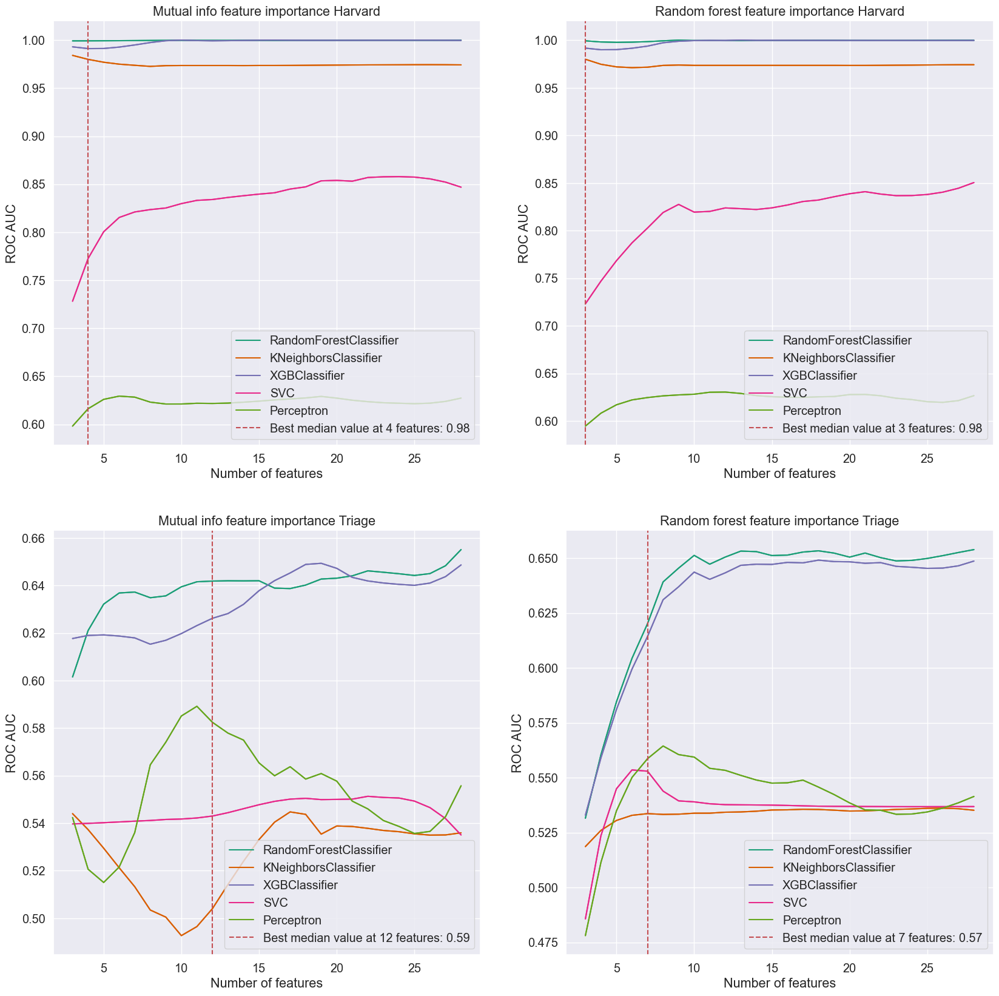

In [24]:
# performance over top features

from scipy.signal import savgol_filter

colors = plt.get_cmap("Dark2")
# create a 2x2 plot
fig, axes = plt.subplots(2, 2, figsize=(20, 20))
i = 0
for key, value in mutual_info_results_harvard.items():
    # smooth the curve
    axes[0, 0].plot(range(3, len(X_harvard.columns)), savgol_filter(value, 10, 3),  color = colors(i))
    # add a smooth curve through the points
    axes[0, 0].plot(range(3, len(X_harvard.columns)), savgol_filter(value, 10, 3), label=key, color = colors(i))
    i += 1
i = 0
for key, value in rf_results_harvard.items():
    axes[0, 1].plot(range(3, len(X_harvard.columns)), savgol_filter(value, 10, 3),  color = colors(i))
    # add a smooth curve through the points
    axes[0, 1].plot(range(3, len(X_harvard.columns)), savgol_filter(value, 10, 3), label=key, color = colors(i))
    i += 1
i = 0
for key, value in mutual_info_results_triage.items():
    axes[1, 0].plot(range(3, len(X_triage.columns)), savgol_filter(value, 10, 3),  color = colors(i))
    # add a smooth curve through the points
    axes[1, 0].plot(range(3, len(X_triage.columns)), savgol_filter(value, 10, 3), label=key, color = colors(i))
    i += 1
i = 0
for key, value in rf_results_triage.items():
    axes[1, 1].plot(range(3, len(X_triage.columns)), savgol_filter(value, 10, 3),  color = colors(i))
    # add a smooth curve through the points
    axes[1, 1].plot(range(3, len(X_triage.columns)), savgol_filter(value, 10, 3), label=key, color = colors(i))
    i += 1


# calculate the median of all 3 classifiers
median_mi_harvard = np.median([value for key, value in mutual_info_results_harvard.items()], axis=0)
median_mi_triage = np.median([value for key, value in mutual_info_results_triage.items()], axis=0)

# the value with the highest median is the best
best_mi_harvard = np.argmax(median_mi_harvard) + 3
best_mi_value_harvard = np.round(np.max(median_mi_harvard), 2)
best_mi_triage = np.argmax(median_mi_triage) + 3
best_mi_value_triage = np.round(np.max(median_mi_triage), 2)
median_rf_harvard = np.median([value for key, value in rf_results_harvard.items()], axis=0)
median_rf_triage = np.median([value for key, value in rf_results_triage.items()], axis=0)
best_rf_harvard = np.argmax(median_rf_harvard) + 3 
best_rf_value_harvard = np.round(np.max(median_rf_harvard), 2)
best_rf_triage = np.argmax(median_rf_triage) + 3
best_rf_value_triage = np.round(np.max(median_rf_triage), 2)

# add a vertical line at the best value
axes[0,0].axvline(best_mi_harvard, color='r', linestyle='--', label='Best median value at {} features: {}'.format(best_mi_harvard, best_mi_value_harvard))
axes[1,0].axvline(best_mi_triage, color='r', linestyle='--', label='Best median value at {} features: {}'.format(best_mi_triage, best_mi_value_triage))
axes[0,1].axvline(best_rf_harvard, color='r', linestyle='--', label='Best median value at {} features: {}'.format(best_rf_harvard, best_rf_value_harvard))
axes[1,1].axvline(best_rf_triage, color='r', linestyle='--', label='Best median value at {} features: {}'.format(best_rf_triage, best_rf_value_triage))

axes[0,0].set_title('Mutual info feature importance Harvard')
axes[0,0].set_xlabel('Number of features')
axes[0,0].set_ylabel('ROC AUC')
axes[0,1].set_title('Random forest feature importance Harvard')
axes[0,1].set_xlabel('Number of features')
axes[0,1].set_ylabel('ROC AUC')
axes[1,0].set_title('Mutual info feature importance Triage')
axes[1,0].set_xlabel('Number of features')
axes[1,0].set_ylabel('ROC AUC')
axes[1,1].set_title('Random forest feature importance Triage')
axes[1,1].set_xlabel('Number of features')
axes[1,1].set_ylabel('ROC AUC')


# add legend for every axes
for ax in axes.flat:
    ax.legend(loc='lower right')

# Best smallest common subset Triage

                          Accuracy   Precision      Recall          F1  \
RandomForestClassifier  0.51(0.07)  0.13(0.05)  0.43(0.12)   0.2(0.07)   
KNeighborsClassifier    0.45(0.02)  0.11(0.03)   0.4(0.11)  0.17(0.04)   
LogisticRegression      0.46(0.03)  0.18(0.01)  0.87(0.02)   0.3(0.02)   
GaussianNB              0.47(0.06)  0.19(0.01)  0.85(0.07)  0.31(0.02)   
SVC                     0.31(0.04)  0.17(0.01)  0.94(0.04)  0.29(0.02)   

                               AUC  Brier Loss  
RandomForestClassifier   0.5(0.06)  0.27(0.02)  
KNeighborsClassifier    0.41(0.06)  0.34(0.02)  
LogisticRegression      0.64(0.03)   0.26(0.0)  
GaussianNB              0.65(0.04)  0.25(0.01)  
SVC                     0.63(0.02)   0.26(0.0)  
                        Accuracy  Precision    Recall        F1       AUC  \
RandomForestClassifier  0.472222   0.079545  0.333333  0.128440  0.406709   
KNeighborsClassifier    0.494444   0.111111  0.476190  0.180180  0.436208   
LogisticRegression      0.4000

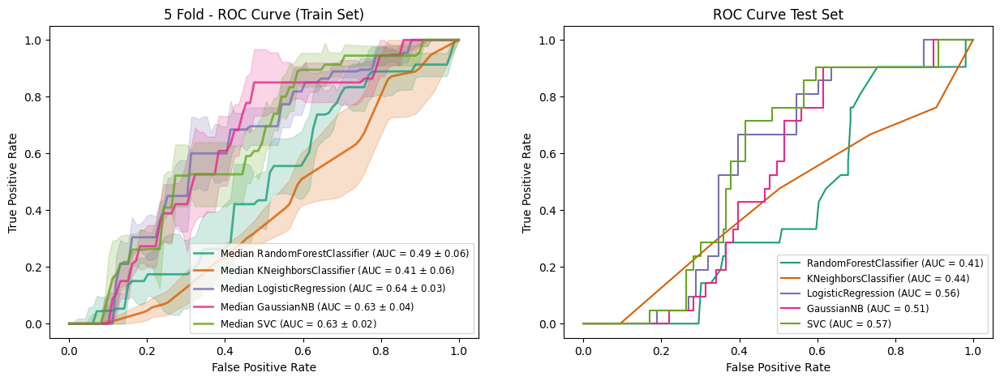

In [16]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = df_harvard.sample(900, random_state=42, replace=True)
triage_concat = df_triage.sample(900, random_state=42, replace=True)

candidate_vars = ['BMI', 'Age', '% FEV1 b', 'MMRC', 'Exacerbation']
harvard_concat = harvard_concat[candidate_vars]
triage_concat = triage_concat[candidate_vars]

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

best_models = [
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', RandomForestClassifier(random_state=42, n_jobs=-1))]),
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', KNeighborsClassifier(n_jobs=-1))]),
    # logistc regression
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', LogisticRegression(random_state=42, n_jobs=-1))]),
    # Naive Bayes
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', GaussianNB())]),
    # SVM
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', SVC(random_state=42, probability=True))]),
]
for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_triage, y_train_triage)):
        model.fit(X_train_triage.iloc[train], y_train_triage.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_harvard.iloc[test],
            y_train_harvard.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_harvard.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_harvard.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_harvard.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_harvard.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_harvard.iloc[test], y_pred))
        y_pred_prob = model.predict_proba(X_train_harvard.iloc[test])
        auc_scores.append(roc_auc_score(y_train_harvard.iloc[test], y_pred_prob[:, 1]))
        brierscores.append(brier_score_loss(y_train_harvard.iloc[test], y_pred_prob[:, 1]))
    evaluation_train.loc[name] = [
        str(np.round(np.median(accuracy_scores), 2)) + "(" + str(np.round(np.std(accuracy_scores), 2)) +")",
        str(np.round(np.median(precision_scores), 2)) + "(" + str(np.round(np.std(precision_scores), 2)) +")",
        str(np.round(np.median(recall_scores), 2)) + "(" + str(np.round(np.std(recall_scores), 2)) +")",
        str(np.round(np.median(f1_scores), 2)) + "(" + str(np.round(np.std(f1_scores), 2)) +")",
        str(np.round(np.median(auc_scores), 2)) + "(" + str(np.round(np.std(auc_scores), 2)) +")",
        str(np.round(np.median(brierscores), 2)) + "(" + str(np.round(np.std(brierscores), 2)) +")",
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_harvard,
            y_test_harvard,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    # if name != "SVC":
    y_pred_proba = model.predict_proba(X_test_harvard)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test_harvard, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    evaluation_test.loc[name] = [
        accuracy_score(y_test_harvard, model.predict(X_test_harvard)),
        precision_score(y_test_harvard, model.predict(X_test_harvard)),
        recall_score(y_test_harvard, model.predict(X_test_harvard)),
        f1_score(y_test_harvard, model.predict(X_test_harvard)),
        roc_auc,
        brier_score_loss(y_test_harvard, y_pred_proba),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)

                        Accuracy  Precision  Recall   F1  AUC  Brier Loss
RandomForestClassifier      0.74       0.69    0.79 0.75 0.81        0.18
XGBClassifier               0.71       0.67    0.78 0.73 0.81        0.18
                        Accuracy  Precision  Recall   F1  AUC  Brier Loss
RandomForestClassifier      0.74       0.67    0.81 0.73 0.78        0.20
XGBClassifier               0.72       0.64    0.84 0.73 0.79        0.19


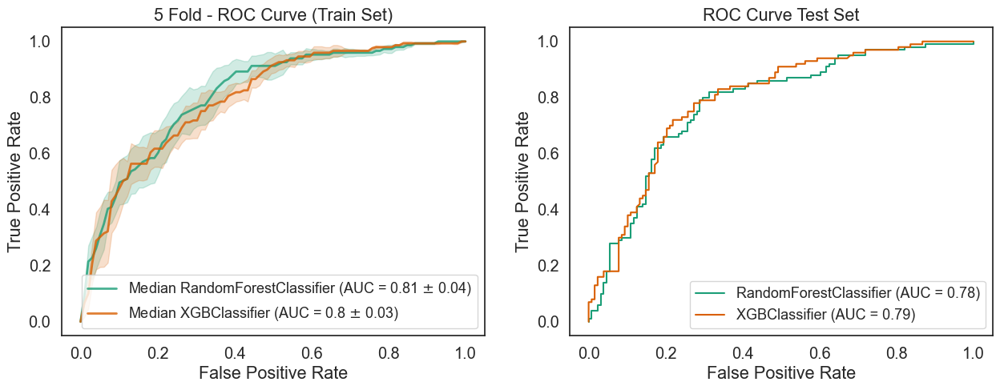

In [211]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")
for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_triage, y_train_triage)):
        model.fit(X_train_triage.iloc[train], y_train_triage.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_triage.iloc[test],
            y_train_triage.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_triage.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_triage.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_triage.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_triage.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_triage.iloc[test], y_pred))
        y_pred_prob = model.predict_proba(X_train_triage.iloc[test])
        auc_scores.append(roc_auc_score(y_train_triage.iloc[test], y_pred_prob[:, 1]))
        brierscores.append(brier_score_loss(y_train_triage.iloc[test], y_pred_prob[:, 1]))
    evaluation_train.loc[name] = [
        np.median(accuracy_scores),
        np.median(precision_scores),
        np.median(recall_scores),
        np.median(f1_scores),
        np.median(auc_scores),
        np.median(brierscores),
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_triage,
            y_test_triage,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    y_pred_proba = model.predict_proba(X_test_triage)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test_triage, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    evaluation_test.loc[name] = [
        accuracy_score(y_test_triage, model.predict(X_test_triage)),
        precision_score(y_test_triage, model.predict(X_test_triage)),
        recall_score(y_test_triage, model.predict(X_test_triage)),
        f1_score(y_test_triage, model.predict(X_test_triage)),
        roc_auc,
        brier_score_loss(y_test_triage, y_pred_proba),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)

# Best common subset Harvard

c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Daniel\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\Daniel\AppData\L

                          Accuracy   Precision      Recall          F1  \
RandomForestClassifier  0.48(0.02)  0.53(0.07)   0.1(0.03)  0.17(0.04)   
KNeighborsClassifier    0.47(0.02)  0.42(0.05)  0.14(0.04)  0.22(0.05)   
LogisticRegression       0.5(0.03)   0.8(0.11)  0.06(0.04)  0.11(0.06)   
GaussianNB              0.57(0.03)  0.59(0.05)  0.59(0.06)  0.59(0.04)   
SVC                     0.49(0.02)    0.0(0.0)    0.0(0.0)    0.0(0.0)   

                               AUC  Brier Loss  
RandomForestClassifier  0.54(0.03)  0.36(0.03)  
KNeighborsClassifier    0.49(0.02)  0.46(0.02)  
LogisticRegression      0.58(0.04)  0.33(0.01)  
GaussianNB              0.56(0.04)  0.37(0.03)  
SVC                      0.5(0.03)  0.41(0.01)  
                        Accuracy  Precision    Recall        F1       AUC  \
RandomForestClassifier  0.444444   0.333333  0.052632  0.090909  0.408854   
KNeighborsClassifier    0.455556   0.448276  0.136842  0.209677  0.446997   
LogisticRegression      0.4722

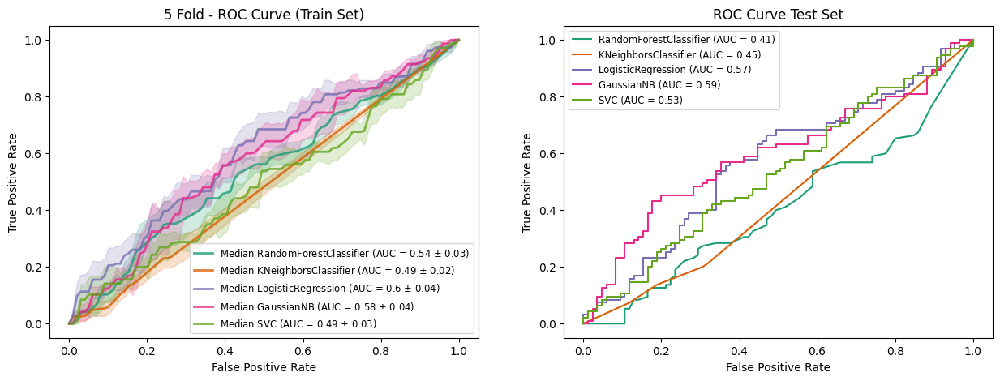

In [18]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = df_harvard.sample(900, random_state=42, replace=True)
triage_concat = df_triage.sample(900, random_state=42, replace=True)

candidate_vars = ['BMI', 'Age', '% FEV1 b', 'MMRC', 'Exacerbation']
harvard_concat = harvard_concat[candidate_vars]
triage_concat = triage_concat[candidate_vars]

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

best_models = [
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', RandomForestClassifier(random_state=42, n_jobs=-1))]),
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', KNeighborsClassifier(n_jobs=-1))]),
    # logistc regression
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', LogisticRegression(random_state=42, n_jobs=-1))]),
    # Naive Bayes
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', GaussianNB())]),
    # SVM
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', SVC(random_state=42, probability=True))]),
]
for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_harvard, y_train_harvard)):
        model.fit(X_train_harvard.iloc[train], y_train_harvard.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_triage.iloc[test],
            y_train_triage.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_triage.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_triage.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_triage.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_triage.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_triage.iloc[test], y_pred))
        y_pred_prob = model.predict_proba(X_train_triage.iloc[test])
        auc_scores.append(roc_auc_score(y_train_triage.iloc[test], y_pred_prob[:, 1]))
        brierscores.append(brier_score_loss(y_train_triage.iloc[test], y_pred_prob[:, 1]))
    evaluation_train.loc[name] = [
        str(np.round(np.median(accuracy_scores), 2)) + "(" + str(np.round(np.std(accuracy_scores), 2)) +")",
        str(np.round(np.median(precision_scores), 2)) + "(" + str(np.round(np.std(precision_scores), 2)) +")",
        str(np.round(np.median(recall_scores), 2)) + "(" + str(np.round(np.std(recall_scores), 2)) +")",
        str(np.round(np.median(f1_scores), 2)) + "(" + str(np.round(np.std(f1_scores), 2)) +")",
        str(np.round(np.median(auc_scores), 2)) + "(" + str(np.round(np.std(auc_scores), 2)) +")",
        str(np.round(np.median(brierscores), 2)) + "(" + str(np.round(np.std(brierscores), 2)) +")",
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_triage,
            y_test_triage,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    y_pred_proba = model.predict_proba(X_test_triage)[:,1]
    fpr, tpr, thresholds = roc_curve(y_test_triage, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    evaluation_test.loc[name] = [
        accuracy_score(y_test_triage, model.predict(X_test_triage)),
        precision_score(y_test_triage, model.predict(X_test_triage)),
        recall_score(y_test_triage, model.predict(X_test_triage)),
        f1_score(y_test_triage, model.predict(X_test_triage)),
        roc_auc,
        brier_score_loss(y_test_triage, y_pred_proba),
    ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)

In [ ]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")
for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_triage, y_train_triage)):
        model.fit(X_train_triage.iloc[train], y_train_triage.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_triage.iloc[test],
            y_train_triage.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_triage.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_triage.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_triage.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_triage.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_triage.iloc[test], y_pred))
        if name != "SVC":
            y_pred_prob = model.predict_proba(X_train_triage.iloc[test])
            auc_scores.append(roc_auc_score(y_train_triage.iloc[test], y_pred_prob[:, 1]))
            brierscores.append(brier_score_loss(y_train_triage.iloc[test], y_pred_prob[:, 1]))
    evaluation_train.loc[name] = [
        np.median(accuracy_scores),
        np.median(precision_scores),
        np.median(recall_scores),
        np.median(f1_scores),
        np.median(auc_scores),
        np.median(brierscores),
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_triage,
            y_test_triage,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    if name != "SVC":
        y_pred_proba = model.predict_proba(X_test_triage)[:,1]
        fpr, tpr, thresholds = roc_curve(y_test_triage, y_pred_proba)
        roc_auc = auc(fpr, tpr)
        evaluation_test.loc[name] = [
            accuracy_score(y_test_triage, model.predict(X_test_triage)),
            precision_score(y_test_triage, model.predict(X_test_triage)),
            recall_score(y_test_triage, model.predict(X_test_triage)),
            f1_score(y_test_triage, model.predict(X_test_triage)),
            roc_auc,
            brier_score_loss(y_test_triage, y_pred_proba),
        ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)

# Blended learning

Number of harvard train samples: 752
Number of harvard test samples: 189
Number of triage train samples: 908
Number of triage test samples: 228
Blend percentage: 0.1
Number to add: 91.0
Percentage harvard: 0.12
Blend percentage: 0.3
Number to add: 272.0
Percentage harvard: 0.36
Blend percentage: 0.6
Number to add: 545.0
Percentage harvard: 0.72
Blend percentage: 1
Number to add: 908
Percentage harvard: 1.21


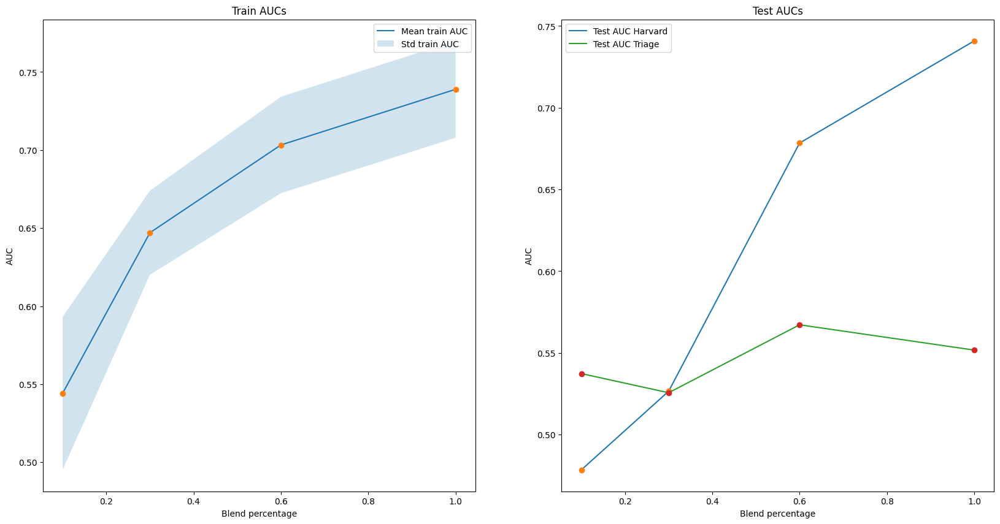

In [4]:
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SelectKBest, mutual_info_classif, f_classif
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split

target = 'Exacerbation'

stratified_k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

harvard_copy = df_harvard.copy()
triage_copy = df_triage.copy()

canditate_vars = ['BMI', 'Age', 'MMRC', '% FEV1 b', 'Exacerbation']

harvard_copy = harvard_copy[canditate_vars]
triage_copy = triage_copy[canditate_vars]

X_harvard = harvard_copy.drop(target, axis=1)
y_harvard = harvard_copy[target]

X_triage = triage_copy.drop(target, axis=1)
y_triage = triage_copy[target]

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(X_harvard, y_harvard, test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(X_triage, y_triage, test_size=0.2, random_state=42)

print("Number of harvard train samples: {}".format(len(X_train_harvard)))
print("Number of harvard test samples: {}".format(len(X_test_harvard)))
print("Number of triage train samples: {}".format(len(X_train_triage)))
print("Number of triage test samples: {}".format(len(X_test_triage)))

model = Pipeline([('imputer', SimpleImputer(strategy='median')),('scaler', StandardScaler()), ('classifier', RandomForestClassifier(random_state=42))])

param_grid = {
    'classifier__n_estimators': [100, 200, 300, 400, 500],
    'classifier__max_depth' : [4,5,6,7,8],
}


blend_percentages = [0.1, 0.3,  0.6, 1]


# Train on triage, blend harvard into it and test on harvard

blend_absolute = []
train_mean_aucs = []
train_std_aucs = []
test_harvard_aucs = []
test_triage_aucs = []
for blend_percentage in blend_percentages:
    print("Blend percentage: {}".format(blend_percentage))
    num_to_add = np.round(blend_percentage * len(X_train_triage))
    print("Number to add: {}".format(num_to_add))
    blend_absolute.append(num_to_add)
    percentage_harvard = np.round(num_to_add / len(X_train_harvard), 2)
    print("Percentage harvard: {}".format(percentage_harvard))
    test_size = 1 - percentage_harvard
    if test_size > 0:
        # split harvard into blending and test set
        X_train_blend_harvard,_  = train_test_split(X_train_harvard, test_size=1-percentage_harvard)
    else:
        X_train_blend_harvard = X_train_harvard
    corresponding_labels = y_train_harvard.loc[X_train_blend_harvard.index]

    train_aucs = []
    test_aucs = []
    blended_X = pd.concat([X_train_triage, X_train_blend_harvard])
    blended_y = pd.concat([y_train_triage, corresponding_labels])
    gridSearch = GridSearchCV(model, param_grid, cv=stratified_k_fold, scoring='roc_auc', n_jobs=-1, return_train_score=True)
    gridSearch.fit(blended_X, blended_y)
    # get mean test score and std
    train_mean_aucs.append(np.mean(gridSearch.cv_results_['mean_test_score']))
    train_std_aucs.append(np.mean(gridSearch.cv_results_['std_test_score']))
    # apply best model on test set
    best_model = gridSearch.best_estimator_
    y_pred_harvard = best_model.predict(X_test_harvard)
    y_pred_triage = best_model.predict(X_test_triage)
    # calculate AUC for harvard
    fpr, tpr, thresholds = metrics.roc_curve(y_test_harvard, y_pred_harvard)
    auc = metrics.auc(fpr, tpr)
    test_harvard_aucs.append(auc)
    # calculate AUC for triage
    fpr, tpr, thresholds = metrics.roc_curve(y_test_triage, y_pred_triage)
    auc = metrics.auc(fpr, tpr)
    test_triage_aucs.append(auc)

# create a 1x2 figure with train and test scores for each blend percentage
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].set_title('Train AUCs')
axs[0].set_xlabel('Blend percentage')
axs[0].set_ylabel('AUC')
axs[1].set_title('Test AUCs')
axs[1].set_xlabel('Blend percentage')
axs[1].set_ylabel('AUC')
# plot the mean train auc and std
axs[0].plot(blend_percentages, train_mean_aucs, label='Mean train AUC')
axs[0].plot(blend_percentages, train_mean_aucs, 'o')
min_std = np.subtract(train_mean_aucs, train_std_aucs)
max_std = np.add(train_mean_aucs, train_std_aucs)
axs[0].fill_between(blend_percentages, min_std, max_std, alpha=0.2, label='Std train AUC')
# plot the test auc
axs[1].plot(blend_percentages, test_harvard_aucs, label='Test AUC Harvard')
axs[1].plot(blend_percentages, test_harvard_aucs, 'o')
axs[1].plot(blend_percentages, test_triage_aucs, label='Test AUC Triage')
axs[1].plot(blend_percentages, test_triage_aucs, 'o')
# add a legend
axs[0].legend()
axs[1].legend()



In [1]:
print(len(X_train_triage))
print(len(X_train_harvard))

NameError: name 'X_train_triage' is not defined

Blend percentage: 0.1
Number to add: 75.0
Percentage triage: 0.08
Blend percentage: 0.3
Number to add: 226.0
Percentage triage: 0.25
Blend percentage: 0.6
Number to add: 451.0
Percentage triage: 0.5
Blend percentage: 1
Number to add: 752
Percentage triage: 0.83


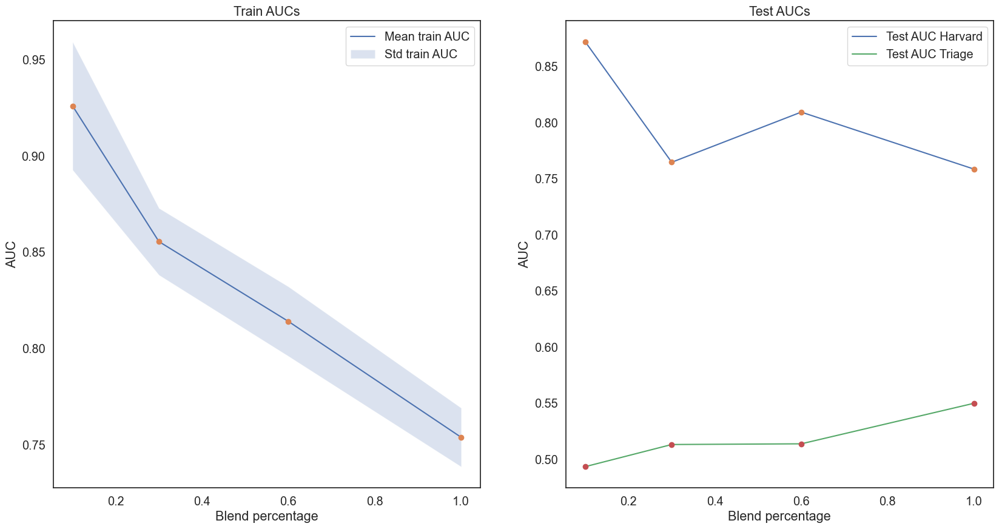

In [217]:
from sklearn import metrics
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.feature_selection import SelectKBest, mutual_info_classif, f_classif

target = 'Exacerbation'

stratified_k_fold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

canditate_vars = ['BMI', 'Age', 'MMRC', '% FEV1 b', 'Exacerbation']

harvard_copy = df_harvard.copy()
triage_copy = df_triage.copy()

harvard_copy = harvard_copy[canditate_vars]
triage_copy = triage_copy[canditate_vars]

X_harvard = harvard_copy.drop(target, axis=1)
y_harvard = harvard_copy[target]

X_triage = triage_copy.drop(target, axis=1)
y_triage = triage_copy[target]

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(X_harvard, y_harvard, test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(X_triage, y_triage, test_size=0.2, random_state=42)

model = Pipeline([('imputer', SimpleImputer(strategy='median')), ('scaler', StandardScaler()), ('classifier', RandomForestClassifier(random_state=42))])

param_grid = {
    'classifier__n_estimators': [100, 200, 300, 400, 500],
    'classifier__max_depth' : [4,5,6,7,8],
}


blend_percentages = [0.1, 0.3,  0.6, 1]


# Train on triage, blend harvard into it and test on harvard

blend_absolute = []
train_mean_aucs = []
train_std_aucs = []
test_harvard_aucs = []
test_triage_aucs = []
for blend_percentage in blend_percentages:
    print("Blend percentage: {}".format(blend_percentage))
    num_to_add = np.round(blend_percentage * len(X_train_harvard))
    print("Number to add: {}".format(num_to_add))
    blend_absolute.append(num_to_add)
    percentage_triage = np.round(num_to_add / len(X_train_triage), 2)
    print("Percentage triage: {}".format(percentage_triage))
    test_size = 1 - percentage_triage
    if test_size > 0:
        # split harvard into blending and test set
        X_train_blend_triage,_  = train_test_split(X_train_triage, test_size=1-percentage_triage)
    else:
        X_train_blend_triage = X_train_triage
    corresponding_labels = y_train_triage.loc[X_train_blend_triage.index]

    train_aucs = []
    test_aucs = []
    blended_X = pd.concat([X_train_harvard, X_train_blend_triage])
    blended_y = pd.concat([y_train_harvard, corresponding_labels])
    gridSearch = GridSearchCV(model, param_grid, cv=stratified_k_fold, scoring='roc_auc', n_jobs=-1, return_train_score=True)
    gridSearch.fit(blended_X, blended_y)
    # get mean test score and std
    train_mean_aucs.append(np.mean(gridSearch.cv_results_['mean_test_score']))
    train_std_aucs.append(np.mean(gridSearch.cv_results_['std_test_score']))
    # apply best model on test set
    best_model = gridSearch.best_estimator_
    y_pred_harvard = best_model.predict(X_test_harvard)
    y_pred_triage = best_model.predict(X_test_triage)
    # calculate AUC for harvard
    fpr, tpr, thresholds = metrics.roc_curve(y_test_harvard, y_pred_harvard)
    auc = metrics.auc(fpr, tpr)
    test_harvard_aucs.append(auc)
    # calculate AUC for triage
    fpr, tpr, thresholds = metrics.roc_curve(y_test_triage, y_pred_triage)
    auc = metrics.auc(fpr, tpr)
    test_triage_aucs.append(auc)

# create a 1x2 figure with train and test scores for each blend percentage
fig, axs = plt.subplots(1, 2, figsize=(20, 10))
axs[0].set_title('Train AUCs')
axs[0].set_xlabel('Blend percentage')
axs[0].set_ylabel('AUC')
axs[1].set_title('Test AUCs')
axs[1].set_xlabel('Blend percentage')
axs[1].set_ylabel('AUC')
# plot the mean train auc and std
axs[0].plot(blend_percentages, train_mean_aucs, label='Mean train AUC')
axs[0].plot(blend_percentages, train_mean_aucs, 'o')
min_std = np.subtract(train_mean_aucs, train_std_aucs)
max_std = np.add(train_mean_aucs, train_std_aucs)
axs[0].fill_between(blend_percentages, min_std, max_std, alpha=0.2, label='Std train AUC')
# plot the test auc
axs[1].plot(blend_percentages, test_harvard_aucs, label='Test AUC Harvard')
axs[1].plot(blend_percentages, test_harvard_aucs, 'o')
axs[1].plot(blend_percentages, test_triage_aucs, label='Test AUC Triage')
axs[1].plot(blend_percentages, test_triage_aucs, 'o')
# add a legend
axs[0].legend()
axs[1].legend()



# Investigating similarities

In [ ]:
distance_per_index = pd.DataFrame(index = shared_columns, columns = ['KS_Total', 'KS_Exa', 'KS_No_Exa'])
# for each pair of features calculate Kolmogorov-Smirnov
for var in shared_columns:
    ks_total = wasserstein_distance(triage_copy[var], harvard_copy[var])
    ks_exa = wasserstein_distance(triage_copy[triage_copy['Exacerbation'] == 1][var], harvard_copy[harvard_copy['Exacerbation'] == 1][var])
    ks_no_exa = wasserstein_distance(triage_copy[triage_copy['Exacerbation'] == 0][var], harvard_copy[harvard_copy['Exacerbation'] == 0][var])
    distance_per_index.loc[var] = [ks_total[0], ks_exa[0], ks_no_exa[0]]

print(distance_per_index)

# harvard
# numeric_cols = df_harvard_preprocessed.columns[df_harvard_preprocessed.nunique() > 2]


fig, axs = plt.subplots(6, 6, figsize=(100, 100))
# plot the histogram of each variable
row, col = 0, 0
for var in sorted(shared_columns):
    if var == 'Exacerbation':
        continue
    # if we are at the end of the row, move to the next row
    if col == 6:
        row += 1
        col = 0
    # create 
    subset_harvard = harvard_copy[[var, 'Exacerbation']]
    # add a row called label
    sns.histplot(subset_harvard, x=var, hue='Exacerbation', ax=axs[row, col], kde=True)
    # add a bar for the mean of each group
    axs[row, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[row, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    axs[row, col].set_title(var)
    # add legend
    axs[row, col].legend(loc='upper right')
    # move to the next column
    col += 1

# set name harvard
fig.suptitle('Harvard', fontsize=16)
# save the figure as svg
plt.savefig('./dist/harvard_similar_cols.svg', format='svg', dpi=1200)

fig, axs = plt.subplots(6, 6, figsize=(100, 100))
# plot the histogram of each variable
row, col = 0, 0
for var in sorted(shared_columns):
    if var == 'Exacerbation':
        continue
    # if we are at the end of the row, move to the next row
    if col == 6:
        row += 1
        col = 0
    # create 
    subset_harvard = triage_copy[[var, 'Exacerbation']]
    # add a row called label
    sns.histplot(subset_harvard, x=var, hue='Exacerbation', ax=axs[row, col], kde=True)
    # add a bar for the mean of each group
    axs[row, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[row, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    axs[row, col].set_title(var)
    # add legend
    axs[row, col].legend(loc='upper right')
    # move to the next column
    col += 1

# set name triage
# fig.suptitle('Triage', fontsize=16)
# save the figure as svg
plt.savefig('./dist/triage_shared_cols.svg', format='svg', dpi=1200)


# turn them back into a dataframe using the previous columns
triage_copy = pd.DataFrame(triage_copy, columns=shared_columns)
harvard_copy = pd.DataFrame(harvard_copy, columns=shared_columns)

# now get similarities again
distance_per_index = pd.DataFrame(index = shared_columns, columns = ['KS_Total', 'KS_Exa', 'KS_No_Exa'])

# for each pair of features calculate Kolmogorov-Smirnov
for var in shared_columns:
    ks_total = wasserstein_distance(triage_copy[var], harvard_copy[var])
    ks_exa = wasserstein_distance(triage_copy[triage_copy['Exacerbation'] == 1][var], harvard_copy[harvard_copy['Exacerbation'] == 1][var])
    ks_no_exa = wasserstein_distance(triage_copy[triage_copy['Exacerbation'] == 0][var], harvard_copy[harvard_copy['Exacerbation'] == 0][var])
    distance_per_index.loc[var] = [ks_total[0], ks_exa[0], ks_no_exa[0]]

# export to csv
distance_per_index.to_csv('similarities.csv', sep=";")

# plot
fig, axs = plt.subplots(6, 6, figsize=(100, 100))
# plot the histogram of each variable
row, col = 0, 0
for var in sorted(shared_columns):
    if var == 'Exacerbation':
        continue
    # if we are at the end of the row, move to the next row
    if col == 6:
        row += 1
        col = 0
    # create subset using index
    subset_harvard = harvard_copy[[var, 'Exacerbation']]
    # add a row called label
    sns.histplot(subset_harvard, x=var, hue='Exacerbation', ax=axs[row, col], kde=True)
    # add a bar for the mean of each group
    axs[row, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[row, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    axs[row, col].set_title(var)
    # add legend
    axs[row, col].legend(loc='upper right')
    # move to the next column
    col += 1

# set name harvard transformed
fig.suptitle('Harvard Transformed', fontsize=16)
# save the figure as svg
plt.savefig('./dist/harvard_shared_cols_transformed.svg', format='svg', dpi=1200)

fig, axs = plt.subplots(6, 6, figsize=(100, 100))
# plot the histogram of each variable
row, col = 0, 0
for var in sorted(shared_columns):
    if var == 'Exacerbation':
        continue
    # if we are at the end of the row, move to the next row
    if col == 6:
        row += 1
        col = 0
    # create 
    subset_harvard = triage_copy[[var, 'Exacerbation']]
    # add a row called label
    sns.histplot(subset_harvard, x=var, hue='Exacerbation', ax=axs[row, col], kde=True)
    # add a bar for the mean of each group
    axs[row, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[row, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    axs[row, col].set_title(var)
    # add legend
    axs[row, col].legend(loc='upper right')
    # move to the next column
    col += 1

# set name triage transformed
fig.suptitle('Triage Transformed', fontsize=16)
# save the figure as svg
plt.savefig('./dist/triage_shared_cols_transformed.svg', format='svg', dpi=1200)



print("----------------")
print(distance_per_index)

AUC: 1.0


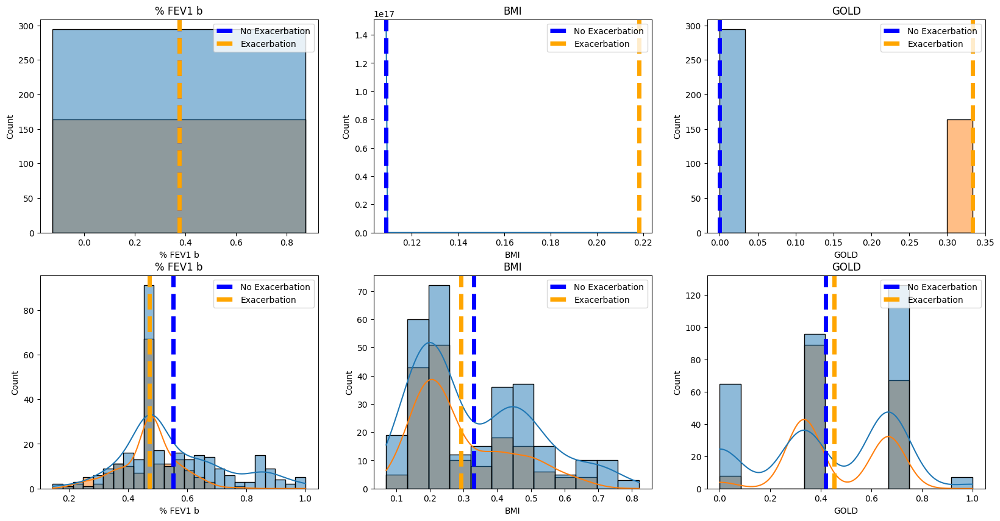

In [66]:
# from sklearn.preprocessing import StandardScaler
# from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
# # import mahalanobis
# from scipy.spatial.distance import euclidean, chebyshev, minkowski, braycurtis, canberra, correlation, cosine, dice, hamming, jaccard, kulsinski, cityblock
# from sklearn.preprocessing import MinMaxScaler
# from sklearn.metrics import roc_auc_score


# triage_copy = df_triage.copy()
# harvard_copy = df_harvard.copy()

# # X_triage = triage_copy.drop('Exacerbation', axis=1)
# # X_harvard = harvard_copy.drop('Exacerbation', axis=1)

# # finding similar rows
# rows_most_similar_total = []
# rows_most_similar_exa = []
# rows_most_similar_no_exa = []

# triage_exa_indices = triage_copy[triage_copy['Exacerbation'] == 1].index
# triage_no_exa_indices = triage_copy[triage_copy['Exacerbation'] == 0].index
# harvard_exa_indices = harvard_copy[harvard_copy['Exacerbation'] == 1].index
# harvard_no_exa_indices = harvard_copy[harvard_copy['Exacerbation'] == 0].index

# # use standard scaler on both datasets
# scaler = MinMaxScaler()
# # scale everything except the target
# harvard_copy[harvard_copy.columns.difference(['Exacerbation'])] = scaler.fit_transform(harvard_copy[harvard_copy.columns.difference(['Exacerbation'])])
# triage_copy[triage_copy.columns.difference(['Exacerbation'])] = scaler.fit_transform(triage_copy[triage_copy.columns.difference(['Exacerbation'])])

# shared_columns = ['% FEV1 b', 'BMI', 'GOLD', 'Exacerbation']

# harvard_copy = harvard_copy[shared_columns]
# harvard_copy.fillna(harvard_copy.median(), inplace=True)
# triage_copy = triage_copy[shared_columns]
# triage_copy.fillna(triage_copy.median(), inplace=True)
# X_triage = triage_copy.drop('Exacerbation', axis=1)
# X_harvard = harvard_copy.drop('Exacerbation', axis=1)

# # export both to csv
# # harvard_copy.to_csv('harvard_copy_harmonized_scaled.csv', sep=";", decimal=",", index=False)
# # triage_copy.to_csv('triage_copy_harmonized_scaled.csv', sep=";", decimal=",", index=False)


# # calculate euclidian distances for each pair of rows
# distances_list_exa = []
# for index in triage_exa_indices:
#     for index2 in harvard_exa_indices:
#         distance_per_index = []
#         # calculate pearson correlation between two vectors
#         distance = cityblock(X_triage.loc[index], X_harvard.loc[index2])
#         # add to list
#         distance_per_index.append([index, index2, distance])
#     # only add the most similar row
#     distances_list_exa.append(min(distance_per_index, key=lambda x: x[2]))
# # sort by smallest euclidian distances
# most_similar_exa = sorted(distances_list_exa, key=lambda x: x[2])
# # only take top 30%
# most_similar_exa = most_similar_exa[:int(len(most_similar_exa) * 0.3)]
# triage_exa_most_sim = triage_copy.loc[[x[0] for x in most_similar_exa]]
# harvard_exa_most_sim = harvard_copy.loc[[x[1] for x in most_similar_exa]]

# # calculate distance for non exa
# distances_list_non_exa = []
# for index in triage_no_exa_indices:
#     for index2 in harvard_no_exa_indices:
#         distance_per_index = []
#         # calculate pearson correlation between two vectors
#         distance = cityblock(X_triage.loc[index], X_harvard.loc[index2])
#         # add to list
#         distance_per_index.append([index, index2, distance])
#     # only add the most similar row
#     distances_list_non_exa.append(min(distance_per_index, key=lambda x: x[2]))
# # sort by smallest euclidian distances
# most_similar_non_exa = sorted(distances_list_non_exa, key=lambda x: x[2])
# # only take top 50%
# most_similar_non_exa = most_similar_non_exa[:int(len(most_similar_non_exa) * 0.5)]
# triage_non_exa_most_sim = triage_copy.loc[[x[0] for x in most_similar_non_exa]]
# harvard_non_exa_most_sim = harvard_copy.loc[[x[1] for x in most_similar_non_exa]]

# # concatenate both
# triage_most_sim = pd.concat([triage_exa_most_sim, triage_non_exa_most_sim])
# harvard_most_sim = pd.concat([harvard_exa_most_sim, harvard_non_exa_most_sim])

# # train on triage predict on harvard
# clf = RandomForestClassifier(random_state=42, n_jobs=-1)
# clf.fit(triage_most_sim.drop(columns=['Exacerbation']), triage_most_sim['Exacerbation'])
# y_pred = clf.predict(harvard_most_sim.drop(columns=['Exacerbation']))
# # calculate AUC
# auc = roc_auc_score(harvard_most_sim['Exacerbation'], y_pred)
# print("AUC: {}".format(auc))

# # plot histograms for both datasets
# fig, axs = plt.subplots(2, 3, figsize=(20, 10))
# # plot the histogram of each variable
# row, col = 0, 0
# for var in sorted(shared_columns):
#     if var == 'Exacerbation':
#         continue
#     # create 
#     subset_harvard = harvard_most_sim[[var, 'Exacerbation']]
#     # add a row called label
#     sns.histplot(subset_harvard, x=var, hue='Exacerbation', ax=axs[0, col], kde=True)
#     # add a bar for the mean of each group
#     axs[0, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
#     axs[0, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
#     # set title
#     axs[0, col].set_title(var)
#     # add legend
#     axs[0, col].legend(loc='upper right')
#     subset_triage = triage_most_sim[[var, 'Exacerbation']]
#     # add a row called label
#     sns.histplot(subset_triage, x=var, hue='Exacerbation', ax=axs[1, col], kde=True)
#     # add a bar for the mean of each group
#     axs[1, col].axvline(subset_triage[subset_triage['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
#     axs[1, col].axvline(subset_triage[subset_triage['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
#     # set title
#     axs[1, col].set_title(var)
#     # add legend
#     axs[1, col].legend(loc='upper right')


#     # move to the next column
#     col += 1



# Matching

In [13]:
from psmpy import PsmPy
from psmpy.functions import cohenD
from psmpy.plotting import *

triage_copy = df_triage.copy()
harvard_copy = df_harvard.copy()

# triage_copy.fillna(triage_copy.median(), inplace=True)
# harvard_copy.fillna(harvard_copy.median(), inplace=True)

# apply KNN imputer
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=5)
triage_copy = pd.DataFrame(imputer.fit_transform(triage_copy), columns=triage_copy.columns)
harvard_copy = pd.DataFrame(imputer.fit_transform(harvard_copy), columns=harvard_copy.columns)

# apply iterative imputer
# from sklearn.experimental import enable_iterative_imputer
# from sklearn.impute import IterativeImputer
# imp = IterativeImputer(max_iter=10, random_state=0)
# triage_copy = pd.DataFrame(imp.fit_transform(triage_copy), columns=triage_copy.columns)
# bin the mmrc into the respective bins from before (1, 2, 3, 4, 5)
triage_copy['MMRC'] = triage_copy['MMRC'].apply(lambda x: 1 if x <= 1 else 2 if x <= 2 else 3 if x <= 3 else 4 if x <= 4 else 5)
# harvard_copy = pd.DataFrame(imp.fit_transform(harvard_copy), columns=harvard_copy.columns)
# bin the mmrc into the respective bins from before (1, 2, 3, 4, 5)
harvard_copy['MMRC'] = harvard_copy['MMRC'].apply(lambda x: 1 if x <= 1 else 2 if x <= 2 else 3 if x <= 3 else 4 if x <= 4 else 5)

canditate_vars = ['BMI', 'Age', 'MMRC', '% FEV1 b', 'Exacerbation']
triage_copy = triage_copy[canditate_vars]
harvard_copy = harvard_copy[canditate_vars]

shared_columns = triage_copy.columns.intersection(harvard_copy.columns)
triage_exa = triage_copy[triage_copy['Exacerbation'] == 1]
triage_no_exa = triage_copy[triage_copy['Exacerbation'] == 0]
harvard_exa = harvard_copy[harvard_copy['Exacerbation'] == 1]
harvard_no_exa = harvard_copy[harvard_copy['Exacerbation'] == 0]

# # perform psm match for the entire distribution
# triage_copy['triage'] = 1
# harvard_copy['triage'] = 0
# total = pd.concat([triage_copy, harvard_copy])
# # reset index
# total.reset_index(drop=True, inplace=True)
# # add index column
# total['index'] = total.index
# psm_total = PsmPy(total, treatment='triage', indx='index', exclude=[], target='Exacerbation') #exclude = ['Exacerbation'])
# psm_total.logistic_ps(balance = True)
# psm_total.knn_matched(matcher='propensity_logit', replacement=False, caliper=None, drop_unmatched=True)
# psm_total.plot_match(Title='Matching Result', Ylabel='# of obs', Xlabel= 'propensity logit', names = ['treatment', 'control'])
# # display(psm_total.effect_size)
# # fig, ax = plt.subplots(figsize=(10, 10))
# # psm_total.effect_size_plot()

# # export dataframe
# total_cohort = psm_total.df_matched
# total_cohort.to_csv('total_cohort.csv', sep=";", decimal=",", index=False)

# perform psm match for exa and no_exa separately
triage_exa['triage'] = 1
triage_no_exa['triage'] = 1
harvard_exa['triage'] = 0
harvard_no_exa['triage'] = 0

exa = pd.concat([triage_exa, harvard_exa])
exa = exa.sample(frac=1)
# reset index
exa.reset_index(drop=True, inplace=True)
exa['index'] = exa.index
no_exa = pd.concat([triage_no_exa, harvard_no_exa])
no_exa = no_exa.sample(frac=1)
# reset index
no_exa.reset_index(drop=True, inplace=True)
no_exa['index'] = no_exa.index

psm_exa = PsmPy(exa, treatment='triage', indx='index', exclude = [], target='Exacerbation')
psm_exa.logistic_ps(balance = True)
psm_exa.knn_matched(matcher='propensity_score', replacement=False, caliper=None, drop_unmatched=True)
# psm_exa.knn_matched_12n(matcher='propensity_score', how_many=1)

psm_no_exa = PsmPy(no_exa, treatment='triage', indx='index', exclude = [], target='Exacerbation')
psm_no_exa.logistic_ps(balance = True)
psm_no_exa.knn_matched(matcher='propensity_score', replacement=False, caliper=None, drop_unmatched=True)
# psm_no_exa.knn_matched_12n(matcher='propensity_score', how_many=1)


print(exa.shape, no_exa.shape)
print(psm_exa.df_matched.shape, psm_no_exa.df_matched.shape)

(682, 7) (1395, 7)
(270, 10) (1178, 10)


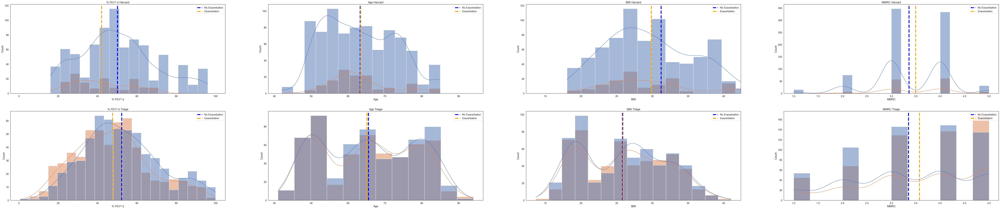

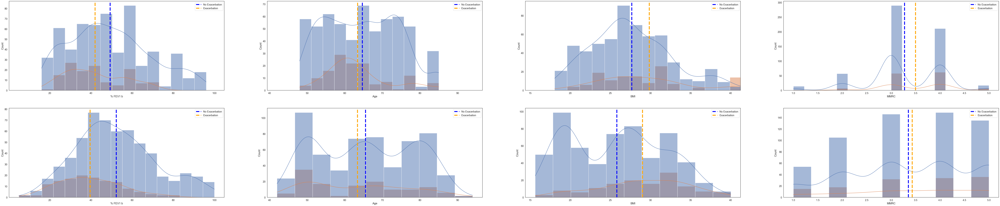

In [23]:
# for case of total propensity score matching

# drop any row that has a NaN value in matched_ID and whose index is not in the matched_ID column
# df_matches_copy = psm_total.df_matched.copy()
# df_matches_copy.dropna(subset=['matched_ID'], inplace=True)
# print(sorted(df_matches_copy['matched_ID'].unique()))
# # add all rows to df_matches that are in the matched_ID column
# df_matches_copy = pd.concat([df_matches_copy, psm_total.df_matched[psm_total.df_matched['index'].isin(df_matches_copy['matched_ID'])]])
# df_matches_copy = df_matches_copy[['BMI', 'Age', 'MMRC', '% FEV1 b', 'Exacerbation', 'triage']]
# triage_concat = df_matches_copy[df_matches_copy['triage'] == 1]
# harvard_concat = df_matches_copy[df_matches_copy['triage'] == 0]


no_exa_matches_copy = psm_no_exa.df_matched.copy()
no_exa_matches_copy.dropna(subset=['matched_ID'], inplace=True)
# add all rows to df_matches that are in the matched_ID column
no_exa_matches_copy = pd.concat([no_exa_matches_copy, psm_no_exa.df_matched[psm_no_exa.df_matched['index'].isin(no_exa_matches_copy['matched_ID'])]])
no_exa_matches_copy = no_exa_matches_copy[['BMI', 'Age', 'MMRC', '% FEV1 b', 'Exacerbation', 'triage']]
no_exa_triage = no_exa_matches_copy[no_exa_matches_copy['triage'] == 1]
no_exa_harvard = no_exa_matches_copy[no_exa_matches_copy['triage'] == 0]

exa_matches_copy = psm_exa.df_matched.copy()
exa_matches_copy.dropna(subset=['matched_ID'], inplace=True)
# add all rows to df_matches that are in the matched_ID column
exa_matches_copy = pd.concat([exa_matches_copy, psm_exa.df_matched[psm_exa.df_matched['index'].isin(exa_matches_copy['matched_ID'])]])
exa_matches_copy = exa_matches_copy[['BMI', 'Age', 'MMRC', '% FEV1 b', 'Exacerbation', 'triage']]
exa_triage = exa_matches_copy[exa_matches_copy['triage'] == 1]
exa_harvard = exa_matches_copy[exa_matches_copy['triage'] == 0]

# # if index is not in the original dataset, it is not in the matched dataset
# psm_exa_indices = psm_exa.df_matched.index
# # remove all indices that are not in the original dataset
# psm_exa_indices = psm_exa_indices[psm_exa_indices.isin(exa.index)]
# exa = exa.loc[psm_exa_indices]
# exa_triage = exa[exa['triage'] == 1]
# exa_harvard = exa[exa['triage'] == 0]

# psm_no_exa_indices = psm_no_exa.df_matched.index
# psm_no_exa_indices = psm_no_exa_indices[psm_no_exa_indices.isin(no_exa.index)]
# no_exa = no_exa.loc[psm_no_exa_indices]
# no_exa_triage = no_exa[no_exa['triage'] == 1]
# no_exa_harvard = no_exa[no_exa['triage'] == 0]

triage_concat = pd.concat([exa_triage, no_exa_triage])
harvard_concat = pd.concat([exa_harvard, no_exa_harvard])

# drop all rows with NaN values
# psm_total.df_matched.dropna(inplace=True)
# only take the values with the first


# plot histograms of datasets before matching
fig, axs = plt.subplots(2, 4, figsize=(100, 20))
# plot the histogram of each variable
row, col = 0, 0
for var in sorted(shared_columns):
    if var == 'Exacerbation':
        continue
    # create 
    subset_harvard = harvard_copy[[var, 'Exacerbation']]
    # add a row called label
    sns.histplot(subset_harvard, x=var, hue='Exacerbation', ax=axs[0, col], kde=True)
    # add a bar for the mean of each group
    axs[0, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[0, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    axs[0, col].set_title(var + " Harvard")
    # add legend
    axs[0, col].legend(loc='upper right')
    subset_triage = triage_copy[[var, 'Exacerbation']]
    # add a row called label
    sns.histplot(subset_triage, x=var, hue='Exacerbation', ax=axs[1, col], kde=True)
    # add a bar for the mean of each group
    axs[1, col].axvline(subset_triage[subset_triage['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[1, col].axvline(subset_triage[subset_triage['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    axs[1, col].set_title(var + " Triage")
    # add legend
    axs[1, col].legend(loc='upper right')
    # enforce same x axis
    axs[0, col].set_xlim(axs[1, col].get_xlim())

    # move to the next column
    col += 1


# plot histograms for both datasets
fig, axs = plt.subplots(2, 4, figsize=(100, 20))
# plot the histogram of each variable
row, col = 0, 0
for var in sorted(shared_columns):
    if var == 'Exacerbation':
        continue
    # create 
    subset_harvard = harvard_concat[[var, 'Exacerbation']]
    # add a row called label
    sns.histplot(subset_harvard, x=var, hue='Exacerbation', ax=axs[0, col], kde=True)
    # add a bar for the mean of each group
    axs[0, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[0, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    # axs[0, col].set_title(var + " Harvard")
    # add legend
    axs[0, col].legend(loc='upper right')
    subset_triage = triage_concat[[var, 'Exacerbation']]
    # add a row called label
    sns.histplot(subset_triage, x=var, hue='Exacerbation', ax=axs[1, col], kde=True)
    # add a bar for the mean of each group
    axs[1, col].axvline(subset_triage[subset_triage['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[1, col].axvline(subset_triage[subset_triage['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    # axs[1, col].set_title(var + " Triage")
    # add legend
    axs[1, col].legend(loc='upper right')
    # enforce same x axis
    axs[0, col].set_xlim(axs[1, col].get_xlim())

    # move to the next column
    col += 1

In [15]:
# calculate Wasserstein distance
from scipy.stats import wasserstein_distance
# import ks test
from scipy.stats import ks_2samp

# get distances before matching for each variable
wasserstein_total_before, wasserstein_exa_before, wasserstein_no_exa_before = [], [], []
ks_total_before, ks_exa_before, ks_no_exa_before = [], [], []
wasserstein_total_after, wasserstein_exa_after, wasserstein_no_exa_after = [], [], []
ks_total_after, ks_exa_after, ks_no_exa_after = [], [], []
shared_columns = ['% FEV1 b', 'BMI', 'Age', 'MMRC']
for var in shared_columns:
    histogram_triage_total = np.histogram(triage_copy[var], bins=20)
    histogram_harvard_total = np.histogram(harvard_copy[var], bins=20)
    histogram_triage_exa = np.histogram(triage_copy[triage_copy['Exacerbation'] == 1][var], bins=20)
    histogram_harvard_exa = np.histogram(harvard_copy[harvard_copy['Exacerbation'] == 1][var], bins=20)
    histogram_triage_no_exa = np.histogram(triage_copy[triage_copy['Exacerbation'] == 0][var], bins=20)
    histogram_harvard_no_exa = np.histogram(harvard_copy[harvard_copy['Exacerbation'] == 0][var], bins=20)

    # calculate wasserstein distance
    wasserstein_total_before.append(wasserstein_distance(histogram_triage_total[0], histogram_harvard_total[0]))
    wasserstein_exa_before.append(wasserstein_distance(histogram_triage_exa[0], histogram_harvard_exa[0]))
    wasserstein_no_exa_before.append(wasserstein_distance(histogram_triage_no_exa[0], histogram_harvard_no_exa[0]))

    histogram_triage_total = np.histogram(triage_concat[var], bins=20)
    histogram_harvard_total = np.histogram(harvard_concat[var], bins=20)
    histogram_triage_exa = np.histogram(triage_concat[triage_concat['Exacerbation'] == 1][var], bins=20)
    histogram_harvard_exa = np.histogram(harvard_concat[harvard_concat['Exacerbation'] == 1][var], bins=20)
    histogram_triage_no_exa = np.histogram(triage_concat[triage_concat['Exacerbation'] == 0][var], bins=20)
    histogram_harvard_no_exa = np.histogram(harvard_concat[harvard_concat['Exacerbation'] == 0][var], bins=20)

    # calculate wasserstein distance
    wasserstein_total_after.append(wasserstein_distance(histogram_triage_total[0], histogram_harvard_total[0]))
    wasserstein_exa_after.append(wasserstein_distance(histogram_triage_exa[0], histogram_harvard_exa[0]))
    wasserstein_no_exa_after.append(wasserstein_distance(histogram_triage_no_exa[0], histogram_harvard_no_exa[0]))

# create a dataframe with column for var, total, exa, no_exa
wasserstein_before = pd.DataFrame(columns=['var', 'total', 'exa', 'no_exa'])
wasserstein_before['var'], wasserstein_before['total'], wasserstein_before['exa'], wasserstein_before['no_exa'] = shared_columns, wasserstein_total_before, wasserstein_exa_before, wasserstein_no_exa_before
# ks_before = pd.DataFrame(columns=['var', 'total', 'exa', 'no_exa'])
# ks_before['var'], ks_before['total'], ks_before['exa'], ks_before['no_exa'] = shared_columns, ks_total_before, ks_exa_before, ks_no_exa_before
wasserstein_after = pd.DataFrame(columns=['var', 'total', 'exa', 'no_exa'])
wasserstein_after['var'], wasserstein_after['total'], wasserstein_after['exa'], wasserstein_after['no_exa'] = shared_columns, wasserstein_total_after, wasserstein_exa_after, wasserstein_no_exa_after
# ks_after = pd.DataFrame(columns=['var', 'total', 'exa', 'no_exa'])
# ks_after['var'], ks_after['total'], ks_after['exa'], ks_after['no_exa'] = shared_columns, ks_total_after, ks_exa_after, ks_no_exa_after

print(wasserstein_before)
print(wasserstein_after)
# print(ks_before)
# print(ks_after)




        var  total   exa  no_exa
0  % FEV1 b  12.75 20.60   10.95
1       BMI  18.65 20.60   21.15
2       Age  10.35 20.60   13.35
3      MMRC  31.05 20.60   27.85
        var  total  exa  no_exa
0  % FEV1 b   4.90 3.00    3.60
1       BMI  12.70 1.60    9.40
2       Age   8.00 2.20    2.30
3      MMRC  26.00 5.00   20.60


In [17]:
# clf = RandomForestClassifier(random_state=42, n_jobs=-1)
from lazypredict.Supervised import LazyClassifier
from sklearn.model_selection import train_test_split


clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)
X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

# models, predictions = clf.fit(X_train_triage, X_test_triage, y_train_triage, y_test_triage)
# models

# models, predictions = clf.fit(X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard)
# models

models, predictions = clf.fit(triage_concat.drop(columns=['Exacerbation']), harvard_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], harvard_concat['Exacerbation'])
print(models)

models, predictions = clf.fit(harvard_concat.drop(columns=['Exacerbation']), triage_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], triage_concat['Exacerbation'])
print(models)

# clf.fit(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'])
# y_pred = clf.predict(harvard_concat.drop(columns=['Exacerbation']))
# # calculate AUC
# auc = roc_auc_score(harvard_concat['Exacerbation'], y_pred)
# print("AUC: {}".format(auc))

# # plot histograms for both datasets
# clf.fit(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'])
# y_pred = clf.predict(triage_concat.drop(columns=['Exacerbation']))
# # calculate AUC
# auc = roc_auc_score(triage_concat['Exacerbation'], y_pred)
# print("AUC: {}".format(auc))

  0%|          | 0/29 [00:00<?, ?it/s]

100%|██████████| 29/29 [00:00<00:00, 35.00it/s]


                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
NearestCentroid                    0.59               0.63     0.63      0.63   
Perceptron                         0.77               0.60     0.60      0.77   
BaggingClassifier                  0.79               0.59     0.59      0.77   
DecisionTreeClassifier             0.69               0.55     0.55      0.71   
GaussianNB                         0.82               0.53     0.53      0.75   
CalibratedClassifierCV             0.82               0.53     0.53      0.75   
LinearDiscriminantAnalysis         0.82               0.53     0.53      0.75   
LogisticRegression                 0.82               0.52     0.52      0.75   
AdaBoostClassifier                 0.81               0.52     0.52      0.74   
SGDClassifier                      0.80               0.51     0.51      0.74   
LabelSpreading              

100%|██████████| 29/29 [00:00<00:00, 36.93it/s]

                               Accuracy  Balanced Accuracy  ROC AUC  F1 Score  \
Model                                                                           
NearestCentroid                    0.64               0.62     0.62      0.68   
BernoulliNB                        0.67               0.61     0.61      0.70   
Perceptron                         0.68               0.61     0.61      0.71   
PassiveAggressiveClassifier        0.71               0.59     0.59      0.73   
SGDClassifier                      0.64               0.57     0.57      0.68   
LogisticRegression                 0.81               0.54     0.54      0.76   
CalibratedClassifierCV             0.82               0.53     0.53      0.76   
LinearDiscriminantAnalysis         0.81               0.53     0.53      0.75   
AdaBoostClassifier                 0.75               0.53     0.53      0.73   
KNeighborsClassifier               0.76               0.53     0.53      0.74   
LabelSpreading              

## Eval: fit Triage, pred. Harvard

                        Accuracy  Precision  Recall   F1  AUC  Brier Loss
RandomForestClassifier      0.75       0.38    0.19 0.25 0.66        0.18
KNeighborsClassifier        0.69       0.23    0.19 0.21 0.55        0.22
LogisticRegression          0.79       0.67    0.12 0.21 0.71        0.16
GaussianNB                  0.78       0.67    0.06 0.12 0.69        0.16
SVC                         0.78       0.00    0.00 0.00  NaN         NaN
                        Accuracy  Precision  Recall   F1  AUC  Brier Loss
RandomForestClassifier      0.77       0.33    0.24 0.28 0.74        0.15
KNeighborsClassifier        0.78       0.38    0.29 0.33 0.66        0.17
LogisticRegression          0.87       0.92    0.32 0.48 0.76        0.13
GaussianNB                  0.86       1.00    0.26 0.42 0.73        0.14


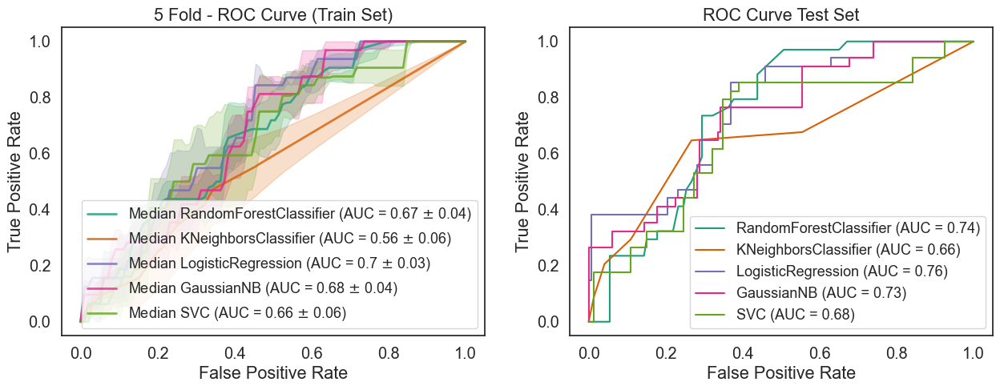

In [19]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = harvard_concat.sample(900, random_state=42, replace=True)
triage_concat = triage_concat.sample(900, random_state=42, replace=True)

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

best_models = [
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', RandomForestClassifier(random_state=42, n_jobs=-1))]),
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', KNeighborsClassifier(n_jobs=-1))]),
    # logistc regression
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', LogisticRegression(random_state=42, n_jobs=-1))]),
    # Naive Bayes
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', GaussianNB())]),
    # SVM
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', SVC(random_state=42, probability=True))]),
]
for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_triage, y_train_triage)):
        model.fit(X_train_triage.iloc[train], y_train_triage.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_harvard.iloc[test],
            y_train_harvard.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_harvard.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_harvard.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_harvard.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_harvard.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_harvard.iloc[test], y_pred))
        if name != "SVC":
            y_pred_prob = model.predict_proba(X_train_harvard.iloc[test])
            auc_scores.append(roc_auc_score(y_train_harvard.iloc[test], y_pred_prob[:, 1]))
            brierscores.append(brier_score_loss(y_train_harvard.iloc[test], y_pred_prob[:, 1]))
    evaluation_train.loc[name] = [
        np.median(accuracy_scores),
        np.median(precision_scores),
        np.median(recall_scores),
        np.median(f1_scores),
        np.median(auc_scores),
        np.median(brierscores),
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_harvard,
            y_test_harvard,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    if name != "SVC":
        y_pred_proba = model.predict_proba(X_test_harvard)[:,1]
        fpr, tpr, thresholds = roc_curve(y_test_harvard, y_pred_proba)
        roc_auc = auc(fpr, tpr)
        evaluation_test.loc[name] = [
            accuracy_score(y_test_harvard, model.predict(X_test_harvard)),
            precision_score(y_test_harvard, model.predict(X_test_harvard)),
            recall_score(y_test_harvard, model.predict(X_test_harvard)),
            f1_score(y_test_harvard, model.predict(X_test_harvard)),
            roc_auc,
            brier_score_loss(y_test_harvard, y_pred_proba),
        ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)

## Eval: fit Harvard, pred Triage

                        Accuracy  Precision  Recall   F1  AUC  Brier Loss
RandomForestClassifier      0.76       0.25    0.06 0.09 0.57        0.19
KNeighborsClassifier        0.74       0.35    0.18 0.24 0.56        0.26
LogisticRegression          0.76       0.45    0.26 0.33 0.75        0.16
GaussianNB                  0.78       0.64    0.09 0.16 0.67        0.17
SVC                         0.77       0.00    0.00 0.00  NaN         NaN
                        Accuracy  Precision  Recall   F1  AUC  Brier Loss
RandomForestClassifier      0.78       0.36    0.11 0.17 0.52        0.18
KNeighborsClassifier        0.74       0.24    0.11 0.15 0.49        0.25
LogisticRegression          0.76       0.29    0.11 0.16 0.68        0.17
GaussianNB                  0.81       0.75    0.08 0.15 0.51        0.19


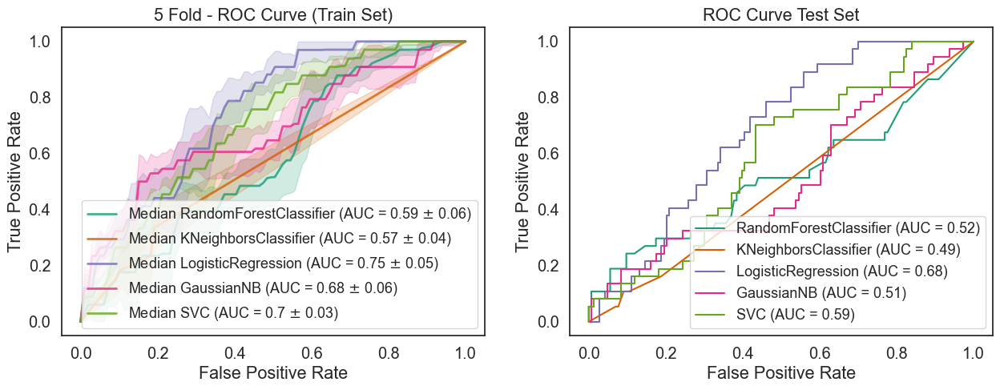

In [20]:
# evaluation on test set
from sklearn.base import clone
from sklearn.metrics import RocCurveDisplay, auc
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, brier_score_loss, roc_curve
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC

evaluation_train = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])
evaluation_test = pd.DataFrame(columns=['Accuracy', 'Precision', 'Recall', 'F1', 'AUC', 'Brier Loss'])

harvard_concat = harvard_concat.sample(900, random_state=42, replace=True)
triage_concat = triage_concat.sample(900, random_state=42, replace=True)

X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_concat.drop(columns=['Exacerbation']), harvard_concat['Exacerbation'], test_size=0.2, random_state=42)

X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_concat.drop(columns=['Exacerbation']), triage_concat['Exacerbation'], test_size=0.2, random_state=42)

# create two subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
colors = plt.get_cmap("Dark2")

stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

best_models = [
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', RandomForestClassifier(random_state=42, n_jobs=-1))]),
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', KNeighborsClassifier(n_jobs=-1))]),
    # logistc regression
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', LogisticRegression(random_state=42, n_jobs=-1))]),
    # Naive Bayes
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', GaussianNB())]),
    # SVM
    Pipeline([('imputer', SimpleImputer(strategy="median")),('clf', SVC(random_state=42, probability=True))]),
]
for i, model in enumerate(best_models):
    name = model.named_steps['clf'].__class__.__name__
    tprs = []
    aucs = []
    median_fpr = np.linspace(0, 1, 100)
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    auc_scores = []
    brierscores = []
    for fold, (train, test) in enumerate(stratified_kfold.split(X_train_harvard, y_train_harvard)):
        model.fit(X_train_harvard.iloc[train], y_train_harvard.iloc[train])
        viz = RocCurveDisplay.from_estimator(
            model,
            X_train_triage.iloc[test],
            y_train_triage.iloc[test],
            alpha=0.3,
            lw=1,
            ax=axes[0],
        )
        viz.line_.set_visible(False)
        viz.line_.set_label(None)
        interp_tpr = np.interp(median_fpr, viz.fpr, viz.tpr)
        interp_tpr[0] = 0.0
        tprs.append(interp_tpr)
        aucs.append(viz.roc_auc)
        y_pred = model.predict(X_train_triage.iloc[test])
        accuracy_scores.append(accuracy_score(y_train_triage.iloc[test], y_pred))
        precision_scores.append(precision_score(y_train_triage.iloc[test], y_pred))
        recall_scores.append(recall_score(y_train_triage.iloc[test], y_pred))
        f1_scores.append(f1_score(y_train_triage.iloc[test], y_pred))
        if name != "SVC":
            y_pred_prob = model.predict_proba(X_train_triage.iloc[test])
            auc_scores.append(roc_auc_score(y_train_triage.iloc[test], y_pred_prob[:, 1]))
            brierscores.append(brier_score_loss(y_train_triage.iloc[test], y_pred_prob[:, 1]))
    evaluation_train.loc[name] = [
        np.median(accuracy_scores),
        np.median(precision_scores),
        np.median(recall_scores),
        np.median(f1_scores),
        np.median(auc_scores),
        np.median(brierscores),
    ]
    median_tpr = np.median(tprs, axis=0)
    median_tpr[-1] = 1.0
    median_auc = auc(median_fpr, median_tpr)
    std_auc = np.std(aucs)
    axes[0].plot(
        median_fpr,
        median_tpr,
        color=colors(i),
        label="Median {} (AUC = {} $\pm$ {})".format(name, np.round(median_auc, 2), np.round(std_auc, 2)),
        lw=2,
        alpha=0.8,
    )

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(median_tpr + std_tpr, 1)
    tprs_lower = np.maximum(median_tpr - std_tpr, 0)
    axes[0].fill_between(
        median_fpr,
        tprs_lower,
        tprs_upper,
        color=colors(i),
        alpha=0.2,
    )

    viz = RocCurveDisplay.from_estimator(
            model,
            X_test_triage,
            y_test_triage,
            alpha=1,
            ax=axes[1],
            color=colors(i),
            name=name
    )
    if name != "SVC":
        y_pred_proba = model.predict_proba(X_test_triage)[:,1]
        fpr, tpr, thresholds = roc_curve(y_test_triage, y_pred_proba)
        roc_auc = auc(fpr, tpr)
        evaluation_test.loc[name] = [
            accuracy_score(y_test_triage, model.predict(X_test_triage)),
            precision_score(y_test_triage, model.predict(X_test_triage)),
            recall_score(y_test_triage, model.predict(X_test_triage)),
            f1_score(y_test_triage, model.predict(X_test_triage)),
            roc_auc,
            brier_score_loss(y_test_triage, y_pred_proba),
        ]

axes[0].set_xlabel("False Positive Rate")
axes[0].set_ylabel("True Positive Rate")
axes[0].set_title("5 Fold - ROC Curve (Train Set)")
axes[0].legend(fontsize='small')

axes[1].set_xlabel("False Positive Rate")
axes[1].set_ylabel("True Positive Rate")
axes[1].set_title("ROC Curve Test Set")
axes[1].legend(fontsize='small')

print(evaluation_train)
print(evaluation_test)

# Subsetting

In [24]:
# take a subset of both datasets with GOLD = 4
harvard_copy = df_harvard.copy()
triage_copy = df_triage.copy()

# get the shared columns
shared_columns = list(set(harvard_copy.columns).intersection(triage_copy.columns))

harvard_copy = harvard_copy[harvard_copy['GOLD'] == 1]
triage_copy = triage_copy[triage_copy['GOLD'] == 1]

harvard_copy.fillna(harvard_copy.median(), inplace=True)
triage_copy.fillna(triage_copy.median(), inplace=True)

# plot the histogram of each variable in harvard and in triage
fig, axs = plt.subplots(5, 6, figsize=(100, 100))
# plot the histogram of each variable
row, col = 0, 0
for var in sorted(shared_columns):
    if var == 'Exacerbation':
        continue
    # if we are at the end of the row, move to the next row
    if col == 6:
        row += 1
        col = 0
    # create 
    subset_harvard = harvard_copy[[var, 'Exacerbation']]
    try:
        # add a row called label
        sns.histplot(subset_harvard, x=var, hue='Exacerbation', ax=axs[row, col], kde=True)
    except:
        print(var)
        continue
    # add a bar for the mean of each group
    axs[row, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[row, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    axs[row, col].set_title(var)
    # add legend
    axs[row, col].legend(loc='upper right')
    # move to the next column
    col += 1

fig, axs = plt.subplots(5, 6, figsize=(100, 100))
# plot the histogram of each variable
row, col = 0, 0
for var in sorted(shared_columns):
    if var == 'Exacerbation':
        continue
    # if we are at the end of the row, move to the next row
    if col == 6:
        row += 1
        col = 0
    # create 
    subset_harvard = triage_copy[[var, 'Exacerbation']]
    try:
        # add a row called label
        sns.histplot(subset_harvard, x=var, hue='Exacerbation', ax=axs[row, col], kde=True)
    except:
        print(var)
        continue
    # add a bar for the mean of each group
    axs[row, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 0][var].mean(), color='blue', linestyle='dashed', linewidth=5, label='No Exacerbation')
    axs[row, col].axvline(subset_harvard[subset_harvard['Exacerbation'] == 1][var].mean(), color='orange', linestyle='dashed', linewidth=5, label='Exacerbation')
    # set title
    axs[row, col].set_title(var)
    # add legend
    axs[row, col].legend(loc='upper right')
    # move to the next column
    col += 1

GOLD
GOLD


# Feature Selection

In [23]:
# feature selection
from sklearn.metrics import roc_auc_score
import umap

harvard_copy = harvard_copy[shared_columns]
triage_copy = triage_copy[shared_columns]

# candidate_vars = ['Wheezing', 'Worse cough', 'Increase in sputum', 'BMI', 'Age', 'FEV1', '% FEV1', 'Fever']
# # candidate_vars = triage_copy.columns
# harvard_copy = harvard_copy[candidate_vars + ['Exacerbation']]
# triage_copy = triage_copy[candidate_vars + ['Exacerbation']]

harvard_copy.fillna(harvard_copy.mean(), inplace=True)
triage_copy.fillna(triage_copy.mean(), inplace=True)

# create a train and test set for the harvard dataset
X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(harvard_copy.drop(columns=['Exacerbation']), harvard_copy['Exacerbation'], test_size=0.3, random_state=42)
# create a train and test set for the triage dataset
X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(triage_copy.drop(columns=['Exacerbation']), triage_copy['Exacerbation'], test_size=0.3, random_state=42)

# train on triage test on harvard
feature_set = []
for num_features in range(len(X_train_harvard.columns)):
    metric_list = []
    model_harvard = Pipeline('umap',umap.UMAP(n_neighbors=20)), ('clf', XGBClassifier(n_estimators=100, max_depth=2, random_state=42))
    model_triage = Pipeline('umap',umap.UMAP(n_neighbors=20)), ('clf', XGBClassifier(n_estimators=100, max_depth=2, random_state=42))
    for feature in X_train_harvard.columns:
        if feature not in feature_set:
            f_set = feature_set.copy()
            f_set.append(feature)
            # now fit the model on 5 folds
            havard_roc = []
            triage_roc = []
            stratified_kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
            # fit on harvard
            model_harvard.fit(X_train_harvard[f_set], y_train_harvard)
            # predict on train triage
            y_pred_harvard_triage = model_harvard.predict(X_train_triage[f_set])
            roc_harvard_triage = roc_auc_score(y_train_triage, y_pred_harvard_triage)
            y_pred_harvard_harvard = model_harvard.predict(X_train_harvard[f_set])
            roc_harvard_harvard = roc_auc_score(y_train_harvard, y_pred_harvard_harvard)
            roc_harvard_harvard -= 0.5 * roc_harvard_harvard
            # fit on triage
            model_triage.fit(X_train_triage[f_set], y_train_triage)
            # predict on train harvard
            y_pred_triage_harvard = model_triage.predict(X_train_harvard[f_set])
            roc_triage_harvard = roc_auc_score(y_train_harvard, y_pred_triage_harvard)
            y_pred_triage_triage = model_triage.predict(X_train_triage[f_set])
            roc_triage_triage = roc_auc_score(y_train_triage, y_pred_triage_triage) 
            roc_triage_triage -= 0.5 * roc_triage_triage
            # calculate the mean of all 4
            mean = np.median([roc_harvard_triage, roc_harvard_harvard, roc_triage_harvard, roc_triage_triage])
            metric_list.append((mean, feature))
    metric_list.sort(key=lambda x : x[0], reverse = True) # In case metric follows "the more, the merrier"
    # print best score
    print(str(len(feature_set))+ " "+str(metric_list[0][0]))
    feature_set.append(metric_list[0][1])
    print(feature_set)


# plt.plot(harvard_roc, label='Harvard')
# plt.plot(triage_roc, label='Triage')
# plt.plot(mean_roc, label='Mean')
# plt.legend()

NameError: name 'Pipeline' is not defined

In [ ]:
# train a regressor on the harvard data with triage data as the target
# then use the regressor to predict the triage data
# then compare the predicted triage data to the actual triage data

# from sklearn.ensemble import RandomForestRegressor
# from sklearn.model_selection import train_test_split
# from sklearn.metrics import mean_squared_error

# df_harvard_copy = df_harvard.copy()
# df_harvard_copy.fillna(df_harvard_copy.mean(), inplace=True)
# df_triage_copy = df_triage.copy()
# df_triage_copy.fillna(df_triage_copy.mean(), inplace=True)

# X = df_harvard_copy['% FEV1 b'].values.reshape(-1, 1)
# y = df_triage_copy['% FEV1 b'].values.reshape(-1, 1)
# # shorten y symmetrically to match X
# difference = y.shape[0] - X.shape[0]
# y = y[difference//2:-difference//2]


# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# regressor = RandomForestRegressor(n_estimators=100, max_depth=10)
# regressor.fit(X_train, y_train)

# y_pred = regressor.predict(X_test)

# # plot histogram of X, y, y_pred
# plt.hist(X, bins=100)
# plt.hist(y, bins=100)
# plt.hist(y_pred, bins=100)

# print(mean_squared_error(y_test, y_pred))

# Dimensionality Reduction

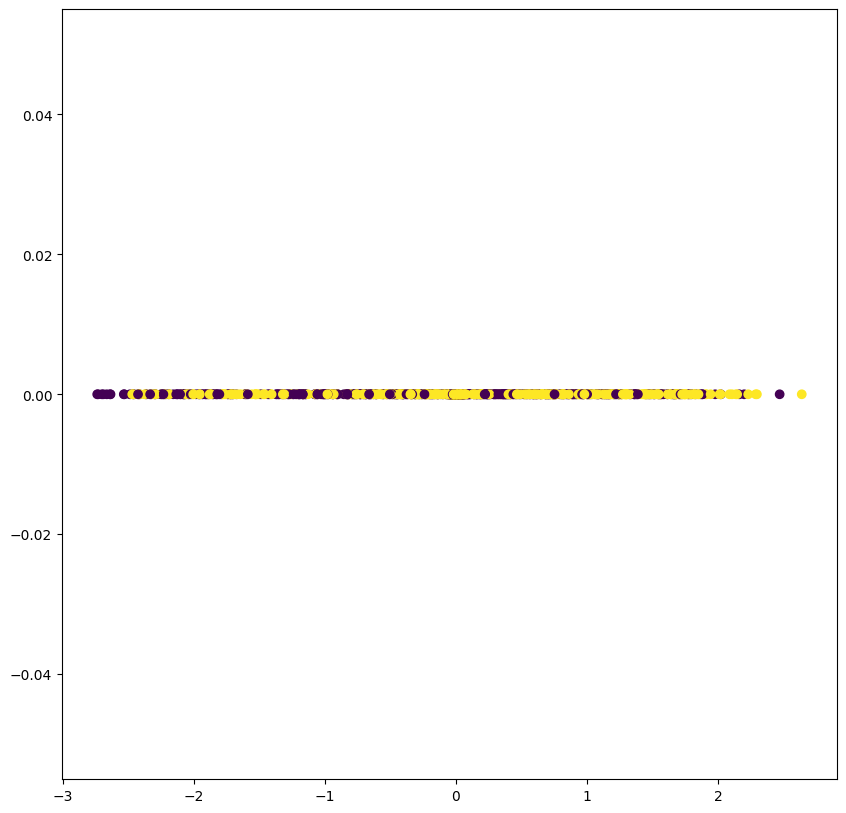

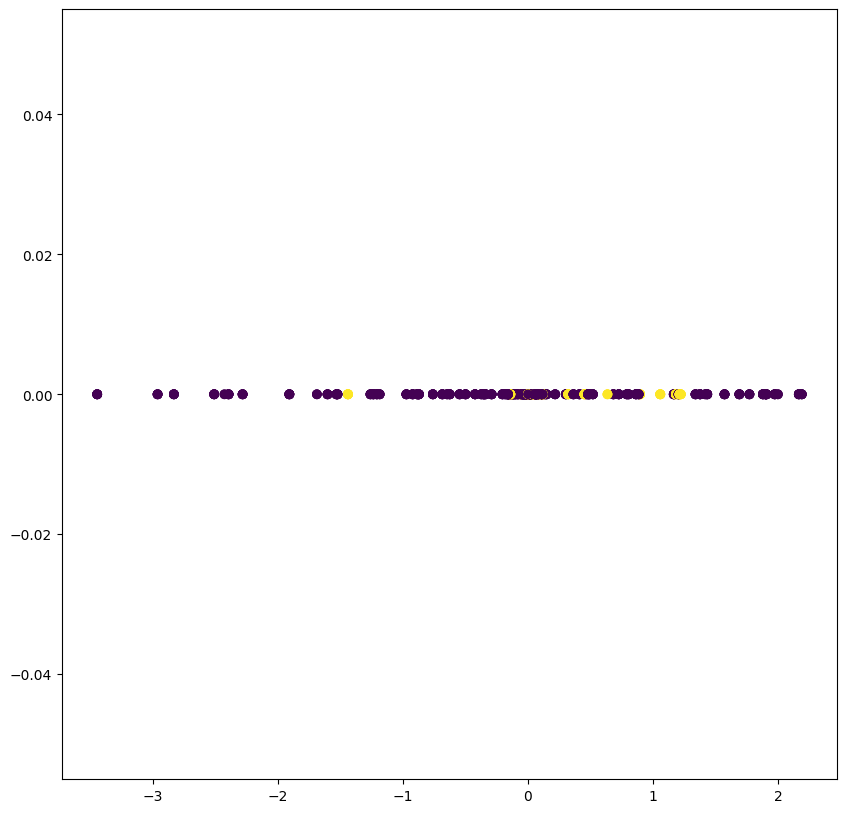

In [11]:
from sklearn.decomposition import PCA
import umap
from imblearn.over_sampling import SMOTE
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

candidate_values = ['% FEV1 b', 'Weight', 'Exacerbation'] #'BMI', 'Weight', 'GOLD'
features = candidate_values[:-1]
df_triage_copy = df_triage.copy()
df_triage_copy.fillna(df_triage_copy.mean(), inplace=True)
df_harvard_copy = df_harvard.copy()
df_harvard_copy.fillna(df_harvard_copy.mean(), inplace=True)
subset_triage = df_triage_copy[candidate_values]
subset_harvard = df_harvard_copy[candidate_values]



# smote = SMOTE()
# subset_triage, y_triage = smote.fit_resample(subset_triage, subset_triage['Exacerbation'])
# subset_triage = pd.DataFrame(subset_triage, columns=candidate_values)
# subset_triage['Exacerbation'] = y_triage

# subset_harvard, y_harvard = smote.fit_resample(subset_harvard, subset_harvard['Exacerbation'])
# subset_harvard = pd.DataFrame(subset_harvard, columns=candidate_values)
# subset_harvard['Exacerbation'] = y_harvard

# embedding = umap.UMAP(n_neighbors=10).fit_transform(subset_triage, y=subset_triage['Exacerbation'])
# plt.scatter(*embedding.T, c=subset_triage['Exacerbation'], cmap='Spectral', alpha=1.0)

# # apply quantile transformation to the data
# quantile_transformer = QuantileTransformer(output_distribution='uniform', random_state=42)
# subset_triage[features] = quantile_transformer.fit_transform(subset_triage[features])
# subset_harvard[features] = quantile_transformer.fit_transform(subset_harvard[features])
# # back to pandas
# subset_triage = pd.DataFrame(subset_triage, columns=candidate_values)
# subset_harvard = pd.DataFrame(subset_harvard, columns=candidate_values)

# pca = PCA(n_components=2)
# pca.fit(subset_triage[features])
# subset_triage_transformed = pca.transform(subset_triage[features])
# # add exacerbations back
# subset_triage_transformed = pd.DataFrame(subset_triage_transformed, columns=['PC1', 'PC2'], index=subset_triage.index)
# subset_triage_transformed['Exacerbation'] = subset_triage['Exacerbation']

# pca = PCA(n_components=2)
# pca.fit(subset_harvard[features])
# subset_harvard_transformed = pca.transform(subset_harvard[features])
# subset_harvard_transformed = pd.DataFrame(subset_harvard_transformed, columns=['PC1', 'PC2'], index=subset_harvard.index)
# subset_harvard_transformed['Exacerbation'] = subset_harvard['Exacerbation']

# subset_triage_transformed = umap.UMAP(n_neighbors=30, n_components=2, n_jobs=-1).fit_transform(subset_triage, y=subset_triage['Exacerbation'])
# subset_harvard_transformed = umap.UMAP(n_neighbors=30, n_components=2, n_jobs=-1).fit_transform(subset_harvard, y=subset_harvard['Exacerbation'])

lda = LinearDiscriminantAnalysis()
lda.fit(subset_triage[features], subset_triage['Exacerbation'])
subset_triage_transformed = lda.transform(subset_triage[features])
lda.fit(subset_harvard[features], subset_harvard['Exacerbation'])
subset_harvard_transformed = lda.transform(subset_harvard[features])



# back to dataframe
subset_triage_transformed = pd.DataFrame(subset_triage_transformed, columns=['PC1'], index=subset_triage.index)
subset_triage_transformed['Exacerbation'] = subset_triage['Exacerbation']
subset_harvard_transformed = pd.DataFrame(subset_harvard_transformed, columns=['PC1'], index=subset_harvard.index)
subset_harvard_transformed['Exacerbation'] = subset_harvard['Exacerbation']

# create 1D plot
fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(subset_triage_transformed['PC1'], np.zeros(len(subset_triage_transformed)), c=subset_triage_transformed['Exacerbation'])

fig, ax = plt.subplots(figsize=(10,10))
ax.scatter(subset_harvard_transformed['PC1'], np.zeros(len(subset_harvard_transformed)), c=subset_harvard_transformed['Exacerbation'])


# # create 2D plot
# fig, ax = plt.subplots(figsize=(10,10))
# ax.scatter(subset_triage_transformed['PC1'], subset_triage_transformed['PC2'], c=subset_triage_transformed['Exacerbation'])

# fig, ax = plt.subplots(figsize=(10,10))
# ax.scatter(subset_harvard_transformed['PC1'], subset_harvard_transformed['PC2'], c=subset_harvard_transformed['Exacerbation'])

# # create 3D scatter plot
# fig = plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(subset_triage_transformed['PC1'], subset_triage_transformed['PC2'], subset_triage_transformed['PC3'], c=subset_triage_transformed['Exacerbation'])

# fig = plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(subset_harvard_transformed['PC1'], subset_harvard_transformed['PC2'], subset_harvard_transformed['PC3'], c=subset_harvard_transformed['Exacerbation'])


# pca = PCA(n_components=3)
# pca.fit(subset_harvard[features])
# subset_harvard_transformed = pca.transform(subset_harvard[features])
# # add exacerbations back
# subset_harvard_transformed = pd.DataFrame(subset_harvard_transformed, columns=['PC1', 'PC2', 'PC3'], index=subset_harvard.index)
# subset_harvard_transformed['Exacerbation'] = subset_harvard['Exacerbation']


# print na
# print(subset_triage.isna().sum())
# print(subset_harvard.isna().sum())

# X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(subset_harvard_transformed.drop(columns=['Exacerbation']), subset_harvard_transformed['Exacerbation'], test_size=0.2, random_state=42)

# X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(subset_triage_transformed.drop(columns=['Exacerbation']), subset_triage_transformed['Exacerbation'], test_size=0.2, random_state=42)

# from lazypredict.Supervised import LazyClassifier
# clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
# models, predictions = clf.fit(X_train_triage, X_test_harvard, y_train_triage, y_test_harvard)
# print(models)

In [ ]:
# try dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import Isomap
import umap
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score
# pca = PCA(n_components=2)

df_harvard_copy = df_harvard.copy()
df_harvard_copy.fillna(df_harvard_copy.mean(), inplace=True)
df_triage_copy = df_triage.copy()
df_triage_copy.fillna(df_triage_copy.mean(), inplace=True)
X_harvard = df_harvard_copy.drop('Exacerbation', axis=1)
X_triage = df_triage_copy.drop('Exacerbation', axis=1)
y_harvard = df_harvard_copy['Exacerbation']
y_triage = df_triage_copy['Exacerbation']
# Standardize
scaler = StandardScaler()
# quantile_transformer = QuantileTransformer()
X_harvard_scaled = scaler.fit_transform(X_harvard)

# apply smote to harvard data
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X_harvard_scaled, y_harvard = smote.fit_resample(X_harvard_scaled, y_harvard)

isomap = Isomap(n_components=3, n_neighbors=2)
X_harvard_transformed = isomap.fit_transform(X_harvard_scaled, y_harvard)
# 3D scatter plot
fig = plt.figure(figsize=(10,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_harvard_transformed[:,0], X_harvard_transformed[:,1], X_harvard_transformed[:,2], c=y_harvard)

# embedding_harvard = umap.UMAP(n_neighbors=15, n_components=3).fit_transform(X_harvard_scaled, y_harvard)
# embedding_triage = umap.UMAP(n_neighbors=15, n_components=3).fit_transform(df_triage_copy, y_triage)

# from lazypredict.Supervised import LazyClassifier
# from sklearn.model_selection import train_test_split

# X_train_harvard, X_test_harvard, y_train_harvard, y_test_harvard = train_test_split(embedding_harvard, y_harvard, test_size=0.2)
# X_train_triage, X_test_triage, y_train_triage, y_test_triage = train_test_split(embedding_triage, y_triage, test_size=0.2)
# clf = LazyClassifier(verbose=0, ignore_warnings=True, custom_metric=None)
# # models_triage, predictions_triage = clf.fit(X_train_triage, X_test_triage, y_train_triage, y_test_triage)
# model_mixed, predictions_mixed = clf.fit(X_train_harvard, X_test_triage, y_train_harvard, y_test_triage)
# model_mixed
# model_mixed2, predictions_mixed2 = clf.fit(X_train_triage, X_test_harvard, y_train_triage, y_test_harvard)

# # create 2D plot
# fig, ax = plt.subplots(figsize=(10,10))
# ax.scatter(embedding_harvard[:,0], embedding_harvard[:,1], c=y_harvard)

# fig, ax = plt.subplots(figsize=(10,10))
# ax.scatter(embedding_triage[:,0], embedding_triage[:,1], c=y_triage)


# # create 3D scatter plot
# fig = plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(embedding_harvard[:,0], embedding_harvard[:,1], embedding_harvard[:,2], c=y_harvard)

# fig = plt.figure(figsize=(10,10))
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(embedding_triage[:,0], embedding_triage[:,1], embedding_triage[:,2], c=y_triage)

# # pca.fit(X_harvard_scaled)
# # harvard_pca = pca.transform(X_harvard_scaled)
# # print(harvard_pca.shape)
# # plot the scatter plot. Color the points by the class
# plt.scatter(harvard_pca[:,0], harvard_pca[:,1], c=y_harvard)

# fig, ax = plt.subplots(figsize=(10,10))
# # now triage
# X_triage_scaled = scaler.fit_transform(X_triage)

# # pca.fit(X_triage_scaled)
# triage_pca = isomap.fit_transform(X_triage_scaled)
# plt.scatter(triage_pca[:,0], triage_pca[:,1], c=y_triage)

# Cycle GAN

In [ ]:
# import pandas as pd
# from keras.optimizers import Adam
# from keras.initializers import RandomNormal
# from keras.models import Model
# from tensorflow.keras.layers import Input
# from keras.layers import Conv1D
# from keras.layers import LeakyReLU
# from keras.layers import Activation
# from keras.layers import Concatenate
# from keras.layers import BatchNormalization
# from keras_contrib.layers.normalization.instancenormalization import InstanceNormalization
# from keras.utils.vis_utils import plot_model

In [ ]:
# # https://github.com/shreyas253/CycleGAN_1dCNN/tree/master


# # shape of the vector is 29x1

# # define the discriminator model
# def define_discriminator(image_shape):
#     # weight initialization
#     init = RandomNormal(stddev=0.02)
#     # source image input
#     in_image = Input(shape=image_shape)
#     # C64
#     d = Conv1D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(in_image)
#     d = LeakyReLU(alpha=0.2)(d)
#     # C128
#     d = Conv1D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
#     d = InstanceNormalization(axis=-1)(d)
#     d = LeakyReLU(alpha=0.2)(d)
#     # C256
#     d = Conv1D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
#     d = InstanceNormalization(axis=-1)(d)
#     d = LeakyReLU(alpha=0.2)(d)
#     # C512
#     d = Conv1D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
#     d = InstanceNormalization(axis=-1)(d)
#     d = LeakyReLU(alpha=0.2)(d)
#     # second last output layer
#     d = Conv1D(512, (4,4), padding='same', kernel_initializer=init)(d)
#     d = InstanceNormalization(axis=-1)(d)
#     d = LeakyReLU(alpha=0.2)(d)
#     # patch output
#     patch_out = Conv1D(1, (4,4), padding='same', kernel_initializer=init)(d)
#     # define model
#     model = Model(in_image, patch_out)
#     # compile model
#     model.compile(loss='mse', optimizer=Adam(lr=0.0002, beta_1=0.5), loss_weights=[0.5])
#     return model
 
# # define image shape
# image_shape = (256,256,3)
# # create the model
# model = define_discriminator(image_shape)
# # summarize the model
# model.summary()
# # plot the model
# plot_model(model, to_file='discriminator_model_plot.png', show_shapes=True, show_layer_names=True)